# **Importing needed Libraries**

In [2]:
import tensorflow as tf
from tensorflow.keras.layers import AveragePooling2D, Dropout, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from google.colab import files
import matplotlib.pyplot as plt
from keras.applications import VGG19
from keras.layers import Conv2D, MaxPooling2D,Dense,Activation,Dropout,Flatten,BatchNormalization
from keras.layers import Dense,Dropout,Input,MaxPooling2D,MaxPool2D,Conv2D,Flatten
from keras.models import Sequential
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam,SGD
from PIL import Image
import cv2
import numpy as np
from matplotlib import pyplot as plt


# **Get The Kaggle Dataset**

[Dataset Link](https://www.kaggle.com/datasets/volkandl/car-brand-logos)



In [3]:
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

api_token = {"username":"<key>","key":"<value>"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


# **Download The Dataset**

In [4]:
!kaggle datasets download -d volkandl/car-brand-logos


car-brand-logos.zip: Skipping, found more recently modified local copy (use --force to force download)


**Unzip The dataset**

In [5]:
!unzip 'car-brand-logos.zip' -d car-brand-logos

Archive:  car-brand-logos.zip
replace car-brand-logos/Car_Brand_Logos/README.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: car-brand-logos/Car_Brand_Logos/README.txt  
replace car-brand-logos/Car_Brand_Logos/Test/hyundai/-car-hyundai-i30-hyundai-tucs-car-logo-5ad2754300c7e0.8761883915237420190032.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: car-brand-logos/Car_Brand_Logos/Test/hyundai/-car-hyundai-i30-hyundai-tucs-car-logo-5ad2754300c7e0.8761883915237420190032.jpg  
replace car-brand-logos/Car_Brand_Logos/Test/hyundai/123123.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: car-brand-logos/Car_Brand_Logos/Test/hyundai/123123.jpg  
replace car-brand-logos/Car_Brand_Logos/Test/hyundai/123qqq.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: car-brand-logos/Car_Brand_Logos/Test/hyundai/123qqq.jpg  
replace car-brand-logos/Car_Brand_Logos/Test/hyundai/12r12r.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: car-brand-logos/Car_Brand_Logos/Te

# **Preprocess and Analysis**

In [6]:
IMAGE_SIZE = 331
BATCH_SIZE = 64

# datagen = tf.keras.preprocessing.image.ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     horizontal_flip=True)

datagen = tf.keras.preprocessing.image.ImageDataGenerator()

# Train generator for train folder
train_generator = datagen.flow_from_directory(
    "/content/car-brand-logos/Car_Brand_Logos/Train",
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    class_mode="categorical",
    color_mode="rgb",
    batch_size=BATCH_SIZE)

# Test generator for test folder
test_generator = datagen.flow_from_directory(
    "/content/car-brand-logos/Car_Brand_Logos/Test",
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    class_mode="categorical",
    color_mode="rgb",
    batch_size=BATCH_SIZE)

Found 2513 images belonging to 8 classes.
Found 400 images belonging to 8 classes.


# **Create and Update the VGG19 model**

A CNN model is created using keras with input shape as **(331,331,3)** which stands for 331x331 RGB pictures .

**A dropout layer has been added to prevent overfitting**
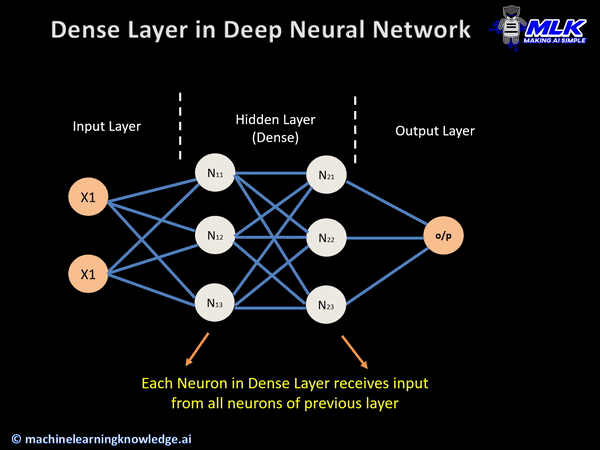

In [7]:
# Import the VGG19 model with pre-trained weights from ImageNet, without the top layer
vgg = VGG19(include_top= False, weights = "imagenet", input_shape=( IMAGE_SIZE,IMAGE_SIZE, 3))

# Get a list of layers in the VGG19 model
vgg_layer_list = vgg.layers

# Initialize a new Sequential model
model = Sequential ()

# Add all the layers from the VGG19 model to the new Sequential model
for layer in vgg_layer_list:
    model.add(layer)

# Freeze the weights of all the layers in the new model
for layer in model.layers:
    layer.trainable = False


model.add(Flatten())
model.add(Dense(1024))
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.2))

#Customizing the top layer
model.add(Dense(8))
model.add(Activation('softmax'))

# Print a summary of the model
model.summary()

# Initialize an Adam optimizer 
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999)
model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 331, 331, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 331, 331, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 165, 165, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 165, 165, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 165, 165, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 82, 82, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 82, 82, 256)       2

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 331, 331, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 331, 331, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 165, 165, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 165, 165, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 165, 165, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 82, 82, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 82, 82, 256)       2

# **Training the Keras Model**

In [8]:
epochs = 10

checkpoint = ModelCheckpoint('model.{epoch:02d}-{val_loss:.2f}.h5',
                             monitor='val_loss',
                             verbose=0,
                             save_best_only=True,
                             mode='auto')

history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=len(test_generator),
                    callbacks=[checkpoint])

Epoch 1/10
40/40 [==============================] - ETA: 0s - loss: 31.0400 - accuracy: 0.5316

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 83s 1s/step - loss: 31.0400 - accuracy: 0.5316 - val_loss: 4.9028 - val_accuracy: 0.7200
Epoch 2/10
40/40 [==============================] - 32s 803ms/step - loss: 2.6851 - accuracy: 0.8392 - val_loss: 4.9524 - val_accuracy: 0.7600
Epoch 3/10
40/40 [==============================] - 33s 805ms/step - loss: 1.5459 - accuracy: 0.8898 - val_loss: 5.6640 - val_accuracy: 0.7550
Epoch 4/10
40/40 [==============================] - 34s 848ms/step - loss: 1.5479 - accuracy: 0.9152 - val_loss: 5.8132 - val_accuracy: 0.7775
Epoch 5/10
40/40 [==============================] - 35s 864ms/step - loss: 1.2940 - accuracy: 0.9276 - val_loss: 6.6663 - val_accuracy: 0.7600
Epoch 6/10
40/40 [==============================] - 35s 873ms/step - loss: 1.2544 - accuracy: 0.9347 - val_loss: 5.3978 - val_accuracy: 0.7875
Epoch 7/10
40/40 [==============================] - 34s 842ms/step - loss: 0.8093 - accuracy: 0.9530 - val_loss: 5.8016 - val_accuracy: 0.7800
Epoch 8/10
4

In [9]:
epochs = 10

checkpoint = ModelCheckpoint('model.{epoch:02d}-{val_loss:.2f}.h5',
                             monitor='val_loss',
                             verbose=0,
                             save_best_only=True,
                             mode='auto')

history2 = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=len(test_generator),
                    callbacks=[checkpoint])

Epoch 1/10
40/40 [==============================] - 43s 1s/step - loss: 0.5808 - accuracy: 0.9717 - val_loss: 6.7161 - val_accuracy: 0.7875
Epoch 2/10
40/40 [==============================] - 45s 1s/step - loss: 0.5073 - accuracy: 0.9698 - val_loss: 6.3781 - val_accuracy: 0.7800
Epoch 3/10
40/40 [==============================] - 34s 831ms/step - loss: 0.7286 - accuracy: 0.9674 - val_loss: 9.7664 - val_accuracy: 0.7700
Epoch 4/10
40/40 [==============================] - 34s 836ms/step - loss: 0.9262 - accuracy: 0.9690 - val_loss: 8.7460 - val_accuracy: 0.7775
Epoch 5/10
40/40 [==============================] - 35s 865ms/step - loss: 1.0149 - accuracy: 0.9713 - val_loss: 13.1287 - val_accuracy: 0.7625
Epoch 6/10
40/40 [==============================] - 34s 846ms/step - loss: 0.8699 - accuracy: 0.9682 - val_loss: 8.4501 - val_accuracy: 0.7775
Epoch 7/10
40/40 [==============================] - 34s 833ms/step - loss: 0.7543 - accuracy: 0.9706 - val_loss: 8.6653 - val_accuracy: 0.7675
Epoc

In [10]:
epochs = 10

checkpoint = ModelCheckpoint('model.{epoch:02d}-{val_loss:.2f}.h5',
                             monitor='val_loss',
                             verbose=0,
                             save_best_only=True,
                             mode='auto')

history3 = model.fit(test_generator,
                    steps_per_epoch=len(test_generator),
                    epochs=epochs,
                    validation_data=train_generator,
                    validation_steps=len(train_generator),
                    callbacks=[checkpoint])

Epoch 1/10
7/7 [==============================] - 54s 9s/step - loss: 12.2100 - accuracy: 0.7650 - val_loss: 0.1777 - val_accuracy: 0.9869
Epoch 2/10
7/7 [==============================] - 56s 9s/step - loss: 5.5249 - accuracy: 0.8300 - val_loss: 0.1303 - val_accuracy: 0.9881
Epoch 3/10
7/7 [==============================] - 33s 5s/step - loss: 2.4372 - accuracy: 0.8775 - val_loss: 0.3529 - val_accuracy: 0.9721
Epoch 4/10
7/7 [==============================] - 33s 5s/step - loss: 1.6764 - accuracy: 0.9175 - val_loss: 0.3101 - val_accuracy: 0.9785
Epoch 5/10
7/7 [==============================] - 33s 5s/step - loss: 1.4261 - accuracy: 0.9225 - val_loss: 0.3387 - val_accuracy: 0.9761
Epoch 6/10
7/7 [==============================] - 33s 5s/step - loss: 1.7375 - accuracy: 0.9350 - val_loss: 0.3211 - val_accuracy: 0.9789
Epoch 7/10
7/7 [==============================] - 33s 5s/step - loss: 1.0368 - accuracy: 0.9575 - val_loss: 0.8426 - val_accuracy: 0.9654
Epoch 8/10
7/7 [=================

In [11]:
epochs = 10

checkpoint = ModelCheckpoint('model.{epoch:02d}-{val_loss:.2f}.h5',
                             monitor='val_loss',
                             verbose=0,
                             save_best_only=True,
                             mode='auto')

history4 = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=len(test_generator),
                    callbacks=[checkpoint])

Epoch 1/10
40/40 [==============================] - 41s 1s/step - loss: 0.6720 - accuracy: 0.9606 - val_loss: 0.0681 - val_accuracy: 0.9900
Epoch 2/10
40/40 [==============================] - 33s 831ms/step - loss: 0.3494 - accuracy: 0.9781 - val_loss: 0.2452 - val_accuracy: 0.9900
Epoch 3/10
40/40 [==============================] - 33s 826ms/step - loss: 0.2857 - accuracy: 0.9825 - val_loss: 1.1196 - val_accuracy: 0.9725
Epoch 4/10
40/40 [==============================] - 33s 823ms/step - loss: 0.3971 - accuracy: 0.9845 - val_loss: 0.7338 - val_accuracy: 0.9875
Epoch 5/10
40/40 [==============================] - 34s 839ms/step - loss: 0.3267 - accuracy: 0.9853 - val_loss: 1.1596 - val_accuracy: 0.9750
Epoch 6/10
40/40 [==============================] - 33s 829ms/step - loss: 0.2929 - accuracy: 0.9861 - val_loss: 0.8118 - val_accuracy: 0.9825
Epoch 7/10
40/40 [==============================] - 34s 829ms/step - loss: 0.2835 - accuracy: 0.9873 - val_loss: 0.8542 - val_accuracy: 0.9825
Ep

# **Loss and Accuracy Curves**

<ipython-input-12-c10fa02e1c14>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


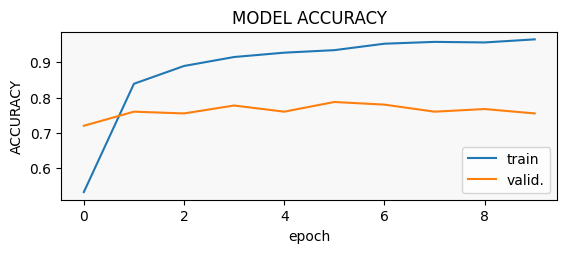

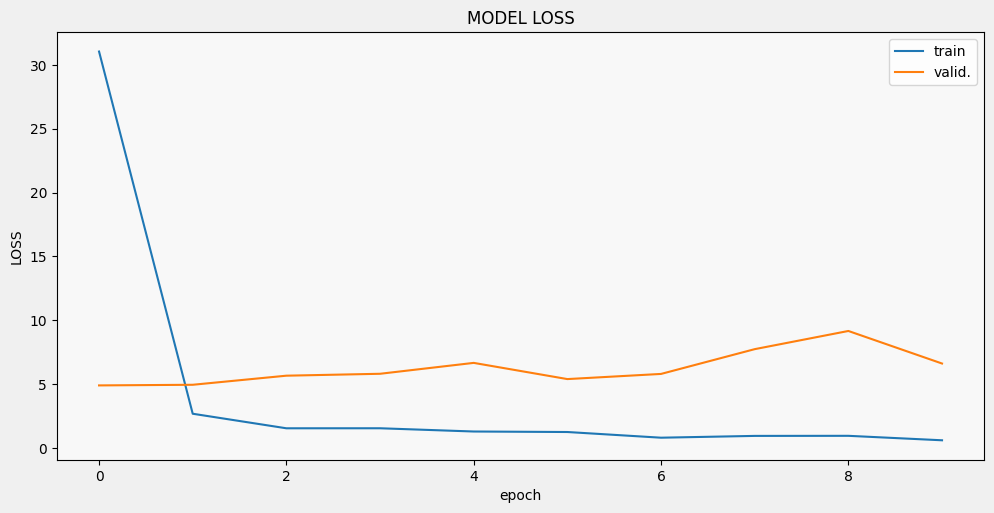

In [12]:
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('MODEL '+ title)
    ax.set_ylabel(title)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

display_training_curves(
    history.history['accuracy'],
    history.history['val_accuracy'],
    'ACCURACY',
    212,
)


display_training_curves(
    history.history['loss'],
    history.history['val_loss'],
    'LOSS',
    211,
)


<ipython-input-12-c10fa02e1c14>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


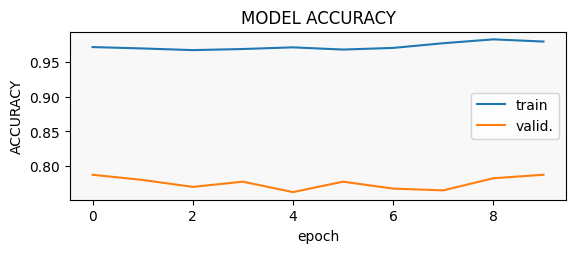

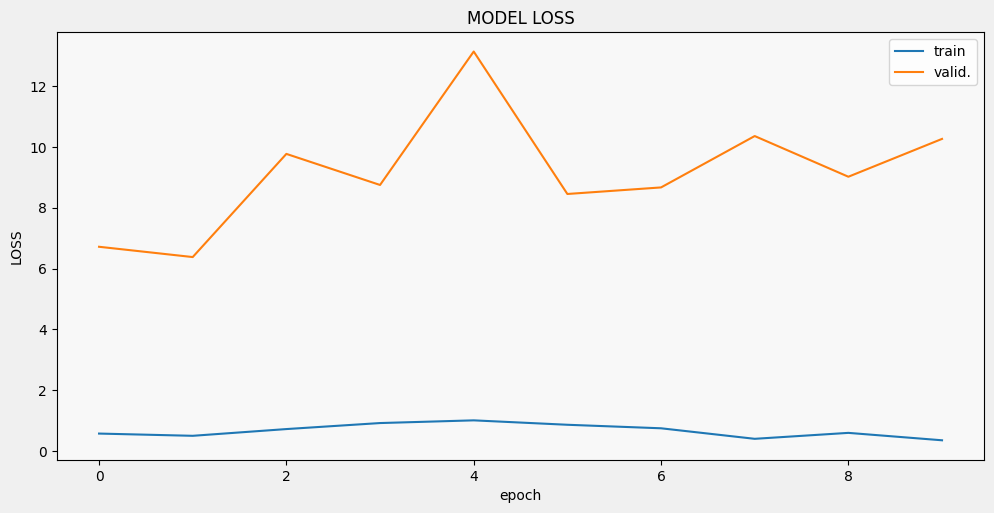

In [13]:
display_training_curves(
    history2.history['accuracy'],
    history2.history['val_accuracy'],
    'ACCURACY',
    212,
)


display_training_curves(
    history2.history['loss'],
    history2.history['val_loss'],
    'LOSS',
    211,
)


<ipython-input-12-c10fa02e1c14>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


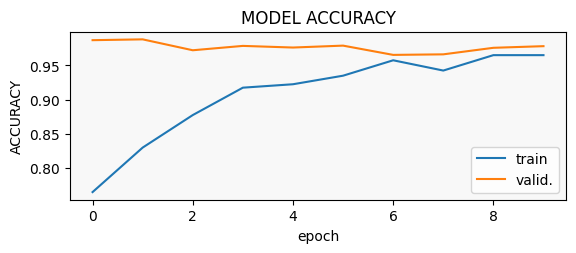

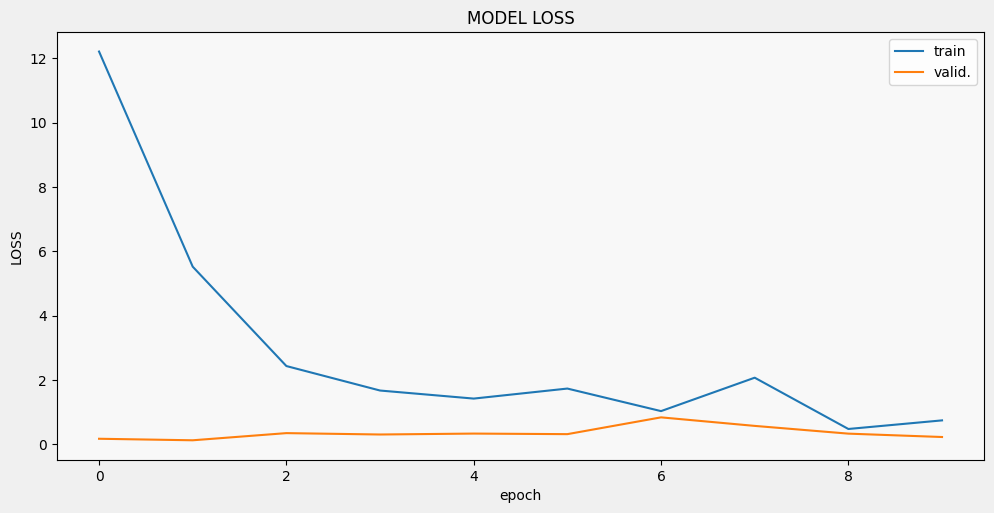

In [14]:
display_training_curves(
    history3.history['accuracy'],
    history3.history['val_accuracy'],
    'ACCURACY',
    212,
)


display_training_curves(
    history3.history['loss'],
    history3.history['val_loss'],
    'LOSS',
    211,
)


<ipython-input-12-c10fa02e1c14>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


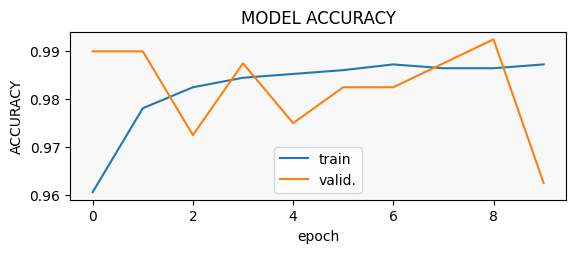

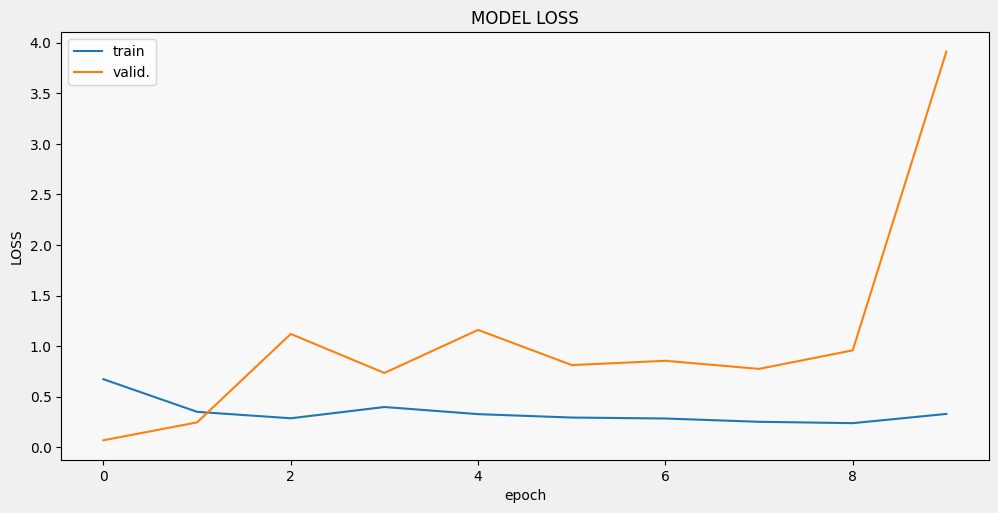

In [15]:
display_training_curves(
    history4.history['accuracy'],
    history4.history['val_accuracy'],
    'ACCURACY',
    212,
)


display_training_curves(
    history4.history['loss'],
    history4.history['val_loss'],
    'LOSS',
    211,
)


# **Accuracy**

In [16]:
score = model.evaluate(test_generator,batch_size=32)
print("Accuracy: {:.2f}%".format(score[1] * 100))
print("Loss: ",score[0])

7/7 [==============================] - 5s 606ms/step - loss: 3.9129 - accuracy: 0.9625
Accuracy: 96.25%
Loss:  3.9128682613372803


In [17]:
score = model.evaluate(train_generator,batch_size=32)
print("Accuracy: {:.2f}%".format(score[1] * 100))
print("Loss: ",score[0])

40/40 [==============================] - 28s 694ms/step - loss: 0.1322 - accuracy: 0.9936
Accuracy: 99.36%
Loss:  0.13223151862621307


# **Save The Model**



In [18]:
!rm -R '/content/model'
!mkdir '/content/model'
model.save('/content/model')

In [19]:
!zip -r model.zip /content/model

updating: content/model/ (stored 0%)
updating: content/model/keras_metadata.pb (deflated 95%)
updating: content/model/variables/ (stored 0%)
updating: content/model/variables/variables.index (deflated 69%)
updating: content/model/variables/variables.data-00000-of-00001 (deflated 19%)
updating: content/model/fingerprint.pb (stored 0%)
updating: content/model/saved_model.pb (deflated 89%)
updating: content/model/assets/ (stored 0%)


# **Reconstruct the model and check the predicted accuracy**

In [20]:
reconstructed_model = tf.keras.models.load_model('/content/model/')
score = reconstructed_model.evaluate(test_generator,batch_size=32)
print("Accuracy: {:.2f}%".format(score[1] * 100))
print("Loss: ",score[0])

score = reconstructed_model.evaluate(train_generator,batch_size=32)
print("Accuracy: {:.2f}%".format(score[1] * 100))
print("Loss: ",score[0])

7/7 [==============================] - 5s 603ms/step - loss: 3.9129 - accuracy: 0.9625
Accuracy: 96.25%
Loss:  3.9128682613372803
40/40 [==============================] - 29s 704ms/step - loss: 0.1322 - accuracy: 0.9936
Accuracy: 99.36%
Loss:  0.13223151862621307


# **Test With Random Images**

In [21]:
class_names=train_generator.class_indices

labels={}
for key, value in class_names.items():
    labels[value]=key

In [22]:
labels

{0: 'hyundai',
 1: 'lexus',
 2: 'mazda',
 3: 'mercedes',
 4: 'opel',
 5: 'skoda',
 6: 'toyota',
 7: 'volkswagen'}

# **Predict for sample images**



In [23]:
def GetResultForImage(image_location):
  img = cv2.imread(image_location, cv2.IMREAD_UNCHANGED)

  print('Original Dimensions : ',img.shape)
  resized = cv2.resize(img,(IMAGE_SIZE,IMAGE_SIZE),3)
  result = np.expand_dims(resized, axis=0)
  result=reconstructed_model.predict(result)
  predicted_label = labels[np.argmax(result)]
  print(predicted_label)

  # Convert the image from BGR to RGB
  resized = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)

  # Display the image
  plt.imshow(resized)
  plt.title(predicted_label)
  plt.show()

Importing images from Internet

In [24]:
import urllib.request
#hyundai
urllib.request.urlretrieve("https://images.unsplash.com/photo-1588036873025-7261a5647adf?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2220&q=80", "hyundai-1.jpg")
urllib.request.urlretrieve("https://images.unsplash.com/photo-1471977360223-d8cc63cec57c?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2340&q=80", "hyundai-2.jpg")

#lexus
urllib.request.urlretrieve("data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAASwAAACoCAMAAABt9SM9AAAAeFBMVEX///8AAAD29vaysrJ6enpHR0fGxsZ0dHQpKSn5+fmmpqZjY2NtbW3W1tbo6OhLS0uMjIw3Nzfw8PBfX1+dnZ28vLzi4uKSkpLPz8+srKy2trZQUFAiIiLk5OTc3NwTExOEhISPj48ZGRk+Pj4xMTFYWFgLCwsdHR0qW3nfAAAJyUlEQVR4nO2d22LiIBCG10NTE020qfFUtbGt9v3fcGs0BJjhnBqxfFe7FhV+YRhmgPz7FwgEAoFAIBAIBAKBQCAQCAQCN6Cf7dNVdCZNs7zr2twpi2I+fP3qAbZvw3mxj7uu3t2QJs8jqBLLabyM/nw/WyRHlU4Nn4uuq9sh6eykr1RFv+sqd0Q+f0dG23G4HESrfZbna0ys6OeNvemm67rfmHTM6/BUbvZMkRdErJ+XqzeWf8h+RZ+sBi/LFSizwDvW5vrPyR+xXykr1dMA7SaIVsufl4fkf5M/0Lv6E0aAuaDJU6jVsfpDXpIXZjesdicwdvulEBU7QK3e67/ljb2LblPpbug/0VKJmxohgzBr/pwSJ3Zyg0p3xIpuvLBX/WiKaMUqm5DXH9XQL6m2H2QFEa+Bt085mSUGv1jj7qBcq9FOVrCEWk1hKSJ9+TvV7RTKXJXSgpjBwsqRQf14hotyriTW6occ0Qo3TPnH9c9vv1HhDvlUtZyAGCyhWarLvrZd3U55JQ0/KRzvGdTqWVx6qi7iHY0CJ0WUZQW1+pKVr/vWvM3qdkrRtFyhFeZhSbtiXAd64FLcTyiTnSmKPkGtFEuarC73IHH6RgHVz7+EWkm91zN1t32MKbFZmqgMyx5q9aT+/DqM8QiufGOGEDecBTFYOoOrLttCZbvmmTRclW54hVqlOt8wuBYunevaNcQA99aKkkiKQtMh2F6Lq6aPu4cERkeKghnUStdm1zbed9e0cRtUUU0kK639LboD/c451O14URQcQq20DFbF/PqOpVtlu0a3YyFxGYOWkyHsVtmOIRqc5OViqJWqKzLU+2+8XvSQwaWY15DMl1FasHb9hy6V7RrSdPmsPodamfnjJFjhUtmOITl4aZgFS9UfDb+pfp/HyR7iZ8qN9QcUyzSGUDseKs/3jiEmS2p4Ea9BHqZHqH1fj40WibzLvEXEazCPqR+u7/y0r2zXkNZLyiBeg0Ugb63xTfcN0UG2yEM2lVps7SORa28DpsSxlqxwkViDMu6FQHwHbyMPJPJZCotgKVWbXWpErL267H2S1i0Q++9vUCurrBYRS3/1fWcQsYR79Aqo1bfVV/kv1k45DJGN8HZrYSKWdH/OPUMM0lhQIIFaiYoqIF3U3225dQtECS2olW2wkyzFrevaOT15EzZQK9s9C/Vyx87i3QVkrsP7C0zWK2KEYhxH8T1ANjyiQWXExzJeQF8hQR6Pd9MQs4uGaKDf8I4V04FskvA4rkzWO6iFh9tArHeHkk+wr2v3ED8KM1owjmVrcUgfNQ2w3hXEaGGBhAkQy7Zj1Pl7nwOllGONjUNELLtx2Pi23gZoKkgzkNDJAYrV630+GdPk0Tx2HM7IzkEgq2hHPJ4LzzRb2RAT37ZWRknse4TsZSvh35AtpE54f/ywcdMRq6W8/MII7zsW5U0hofV4K2u8Kd5GlBuaVBfmBBlcGKLC931/FQPSHCzzUrTWuW7esF+B+EFb9M8rJH1vgbfxZJbGfRCl5bNovSyHDpSJ3747RXPUy+N9Gzej2axWdl0VDxj+St+K51eSFj/0Dhgr7ZY55Iy0vxscBDTxmK+WUnvNTmh/c4UiKAfBNi2Bf97oYSZCCmpL8ti5fc12wcc6eU+gD4u7meSsWSV5nPuS06dud/i2H4tZc4TR300zGtCnAz7szunS1wU+xNpZTM7sXpuZLuj6CRUC2z5yt7oQMWGGr7m+j5SvmSM+Xqe9tNmwN5S+l4XaUcqjkg2rPpjTLqHg7t7snSbzSDQkF8WczzB+/I1eVbNHg1hP43KZrIsL62Q5HPOqnhl7n5gwp0Ay0mqm60d02HWIym8jpSYbz4+MO5IXJTbUAB+T9QNkb9pgV8yfp6L7zr9eZ4P0r449Mfl+VWySZHkhSTZRugsqBQKBQCAQCAQCgcANiI6vhKP9PXDZqhgMEgt0PjyZYSjDpdGAAt0j30+ZMkLqy5MG9ArfLre0mmlFWXBOyshLLvh0ZS6aiS7CpkVD5HFlOPXvwpy9tRBr57zLUZFURg4HX1AePnmmS/N7nZALzsTU/d9NrAy5ttaYqSQOE4u/wEUs9CF3Yurf00ks4zMSnyn6sjAFwZzvGe2ZU9X2YokGtpAWxIrNTdXXvxi5UUW0fTJjxBlwD7iwFgv/wWS4i4Vc8KvkfPkfcvUFvsXtQBeormhpRSyL02jOYiG3t6upbkrcoQcF+MOuzI1tx4uWbYgFHpPxOlExrutmKxbQamhwkyM6gzLHWPuMYa9tWgticePh3Wjrk6VY4FIGs0QV9tgm2uViJvamVi2IxfpWhifQLcXi/TnTTbC4nb/ahpQepyfK93YXi30QmeklcHZi8Q+gtdhcjdr5s8sVM40s6fc4i8UNQtNEm5VY/IRitbMTt/MrpkJbySOAbcRif2TjfUtWYvEtNP3SK8qVEr+wdxXLsWNZiQXWVYXW2h1OPKidJ7yALVuuYrErDo3n1HDYiCVtoqTx8JP6qJ2/gIxtV7HYaWk0VlNu6KnLQix5fxCD/pKonT8XxuZXR7F2PRuOzUZfC7GQ54BqgXf7HbpHCw9DOooljPYoIO6yhVi2oT6RjUDtPOpZO4qFPDxRj21sLVZ+ITYdjkKDGmEhS6wujmLx3qE+39Zi/UPeqYNYLNTjGkFP11Es5ImAukzcxDKKy1YIHs7QF17uAG7dchRLMvUqSYFYBvdXwVnsrchjOZof1MD/eI5ixUURrQDRKt0DCv5BulV6hMnu6F/UDx+eancf0+ILfBDNlnUgmBYoIwbShIWSZ7Ym1SqFtdK6W6fBw1M/7DZds14IZueZWZER60P14W5i8YGVc2dgn+OifKrnFWBmrLRif6hRis7t9FBkv1b1nY5iHZBfjX1JL4YHnAaLJynwhr0KAWC5hG0zK07gOyQ4isWlrqomcv64llq8obG5jZU17OO6m2C+EPkpuPorupajWNwzuarQNh8g1tjvAKy7+R6JPaP3N3XOEnPf6lmai6ON5PFZN7H4elz6NzAUz5tVKmMPssSzyBC2O7PxhZyftXvEQQXPnTnIsiTMMspQrD6fP67vyJbP3r/OGPQPLNF9GYpIMv9lKuCNWRe8j0yAi3vyg7Z7954Z75h/htn5alZEnsF2IxqPGnm+4I0QRe+Rw4jVrGi+yGoH2t3rqA5vYguNJdnPQ9E6zOIE+3yXfjuXyZkhvdkB2+pyHoq2cVoXgEcXr288GD9ViVnEzldDcXPjik7Rs+5xNJ847Hg0QyPXuEceE1n1xn4xO2rvcXTjbSm/qSPu34AWTl32swVwAfeLXaYgV9UsHAgNBAKBQCAQCAQCgUAgEAgE/hj/AdyQhnaNg4ZaAAAAAElFTkSuQmCC", "lexus-1.jpg")
urllib.request.urlretrieve("https://th.bing.com/th/id/R.c35db0488533309e9b856a30a184e6c7?rik=jToGlPDalY0HDA&pid=ImgRaw&r=0", "lexus-2.jpg")

#mazda
urllib.request.urlretrieve("https://www.shutterstock.com/image-photo/bangkokthailand-may-222014-logo-brand-260nw-204080434.jpg","mazda-1.jpg")
urllib.request.urlretrieve("https://www.schoolphotoproject.com/_picture-of-cars-motorbikes/car-mazda-logo-photo-l.jpg","mazda-2.jpg")


#mercedes
urllib.request.urlretrieve("https://media.gettyimages.com/id/2021660317/photo/mercedes-benz-group-ag-annual-figures.jpg?b=1&s=594x594&w=0&k=20&c=OdStstN1SelPYIqdu5SMgnOU2zJPS9608UxrCDEWSN4=","mercedes-1.jpg")
urllib.request.urlretrieve("https://th.bing.com/th/id/R.ca2fc31ceff5797eb4c31273effdb7db?rik=095liJWl3x4LAA&pid=ImgRaw&r=0","mercedes-2.jpg")
urllib.request.urlretrieve("https://performancedrive.com.au/wp-content/uploads/2021/06/2022-Mercedes-Benz-EQB-750x447.jpeg","mercedes-3.jpg")

#opel
urllib.request.urlretrieve("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQESUxbt7oUoBmKslA5YNh3b0NcXUojMM3Aeg&usqp=CAU","opel-1.jpg")
urllib.request.urlretrieve("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRgyyB9T1otFMlgiMojMr3GE03fFoEsU6reQA&usqp=CAU","opel-2.jpg")


#skoda
urllib.request.urlretrieve("https://thumbs.dreamstime.com/b/bordeaux-aquitaine-france-skoda-logo-brand-car-dealership-text-sign-vehicle-store-showroom-shop-czech-bordeaux-aquitaine-france-219259318.jpg","skoda-1.jpg")
urllib.request.urlretrieve("https://media.gettyimages.com/id/1230550013/photo/a-skoda-logo-seen-on-a-parked-car-in-dublin-city-center-on-tuesday-january-11-in-dublin.jpg?s=612x612&w=gi&k=20&c=b8xHL2cUjvyQC1jGIVLqgglYVZGB7RGWqd5QV2VD5cw=","skoda-2.jpg")


#toyota
urllib.request.urlretrieve("https://us.123rf.com/450wm/engdao/engdao1904/engdao190400491/engdao190400491.jpg?ver=6","toyota-1.jpg")
urllib.request.urlretrieve("https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQLednVkQl--Dx9jOqUFk1t5EXfTkzyiiWPOw&usqp=CAU","toyota-2.jpg")

#volkswagen
urllib.request.urlretrieve("https://www.thedrive.com/content/2020/04/vw-logo-atlas.jpg?quality=85&crop=16%3A9&auto=webp&optimize=high&quality=70&width=1440","volkswagen-1.jpg")
urllib.request.urlretrieve("https://m.media-amazon.com/images/I/51SsqpaeYOL.jpg","volkswagen-2.jpg")


('volkswagen-2.jpg', <http.client.HTTPMessage at 0x7acb85919840>)

**Testing the random images**

Original Dimensions :  (1591, 2220, 3)
1/1 [==============================] - 1s 1s/step
hyundai


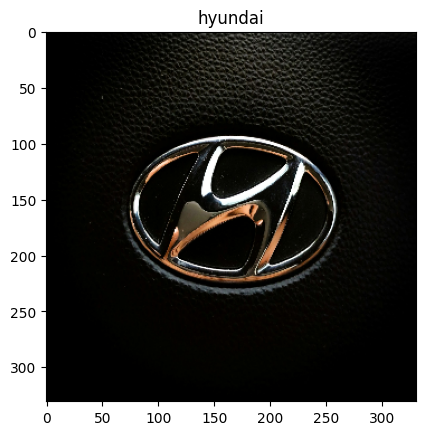

Original Dimensions :  (1560, 2340, 3)
1/1 [==============================] - 0s 27ms/step
hyundai


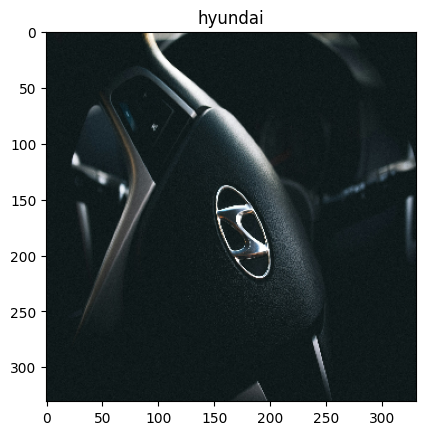

Original Dimensions :  (168, 300, 3)
1/1 [==============================] - 0s 26ms/step
lexus


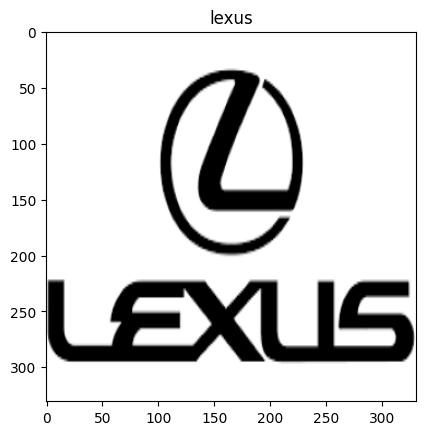

Original Dimensions :  (1406, 2500, 3)
1/1 [==============================] - 0s 28ms/step
lexus


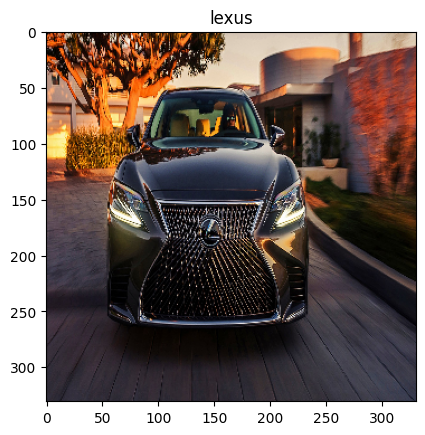

Original Dimensions :  (280, 390, 3)
1/1 [==============================] - 0s 33ms/step
mazda


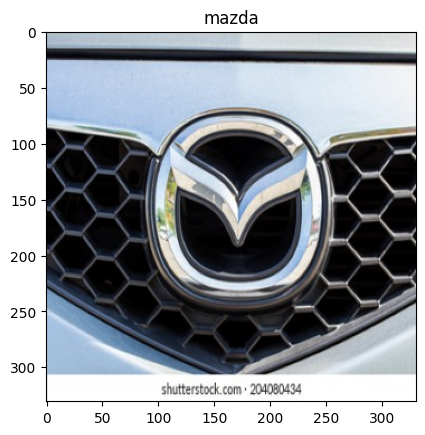

Original Dimensions :  (1704, 2272, 3)
1/1 [==============================] - 0s 19ms/step
mazda


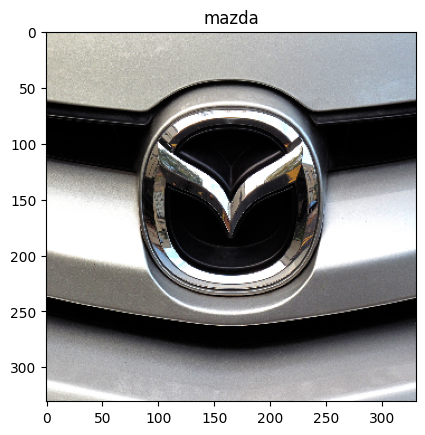

Original Dimensions :  (362, 594, 3)
1/1 [==============================] - 0s 29ms/step
mercedes


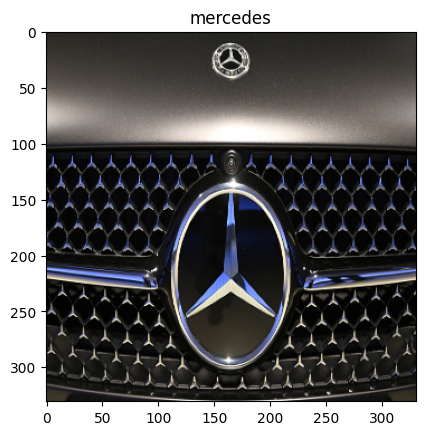

Original Dimensions :  (1067, 1600, 3)
1/1 [==============================] - 0s 19ms/step
mercedes


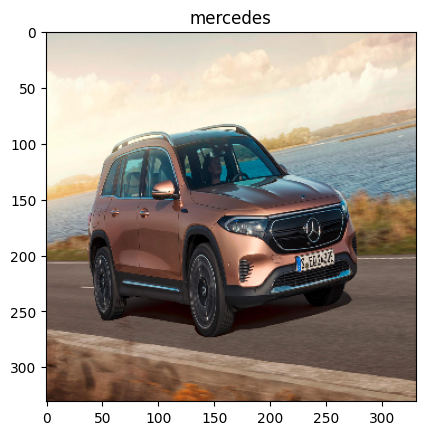

Original Dimensions :  (192, 263, 3)
1/1 [==============================] - 0s 24ms/step
opel


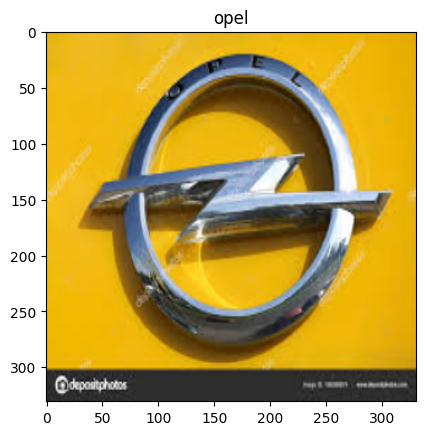

Original Dimensions :  (169, 299, 3)
1/1 [==============================] - 0s 24ms/step
opel


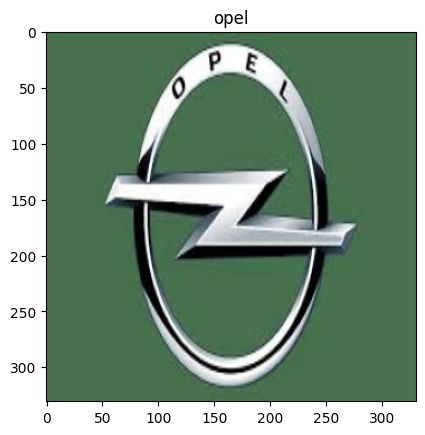

Original Dimensions :  (534, 800, 3)
1/1 [==============================] - 0s 19ms/step
skoda


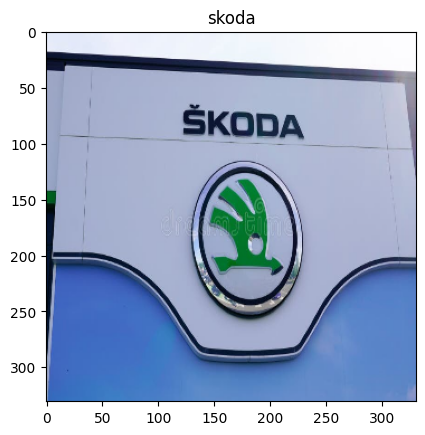

Original Dimensions :  (408, 612, 3)
1/1 [==============================] - 0s 20ms/step
skoda


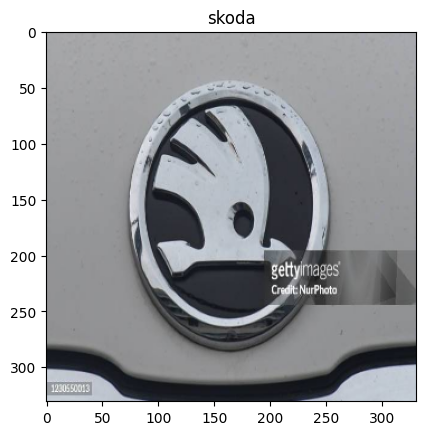

Original Dimensions :  (300, 450, 3)
1/1 [==============================] - 0s 29ms/step
toyota


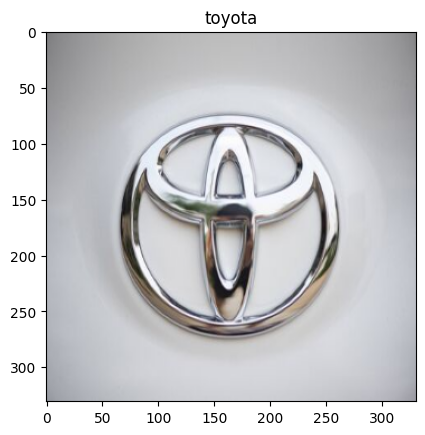

Original Dimensions :  (168, 299, 3)
1/1 [==============================] - 0s 19ms/step
toyota


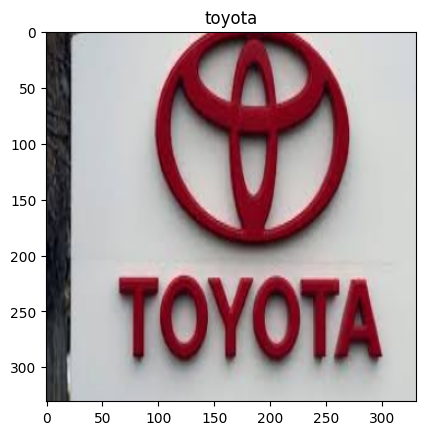

Original Dimensions :  (810, 1440, 3)
1/1 [==============================] - 0s 18ms/step
volkswagen


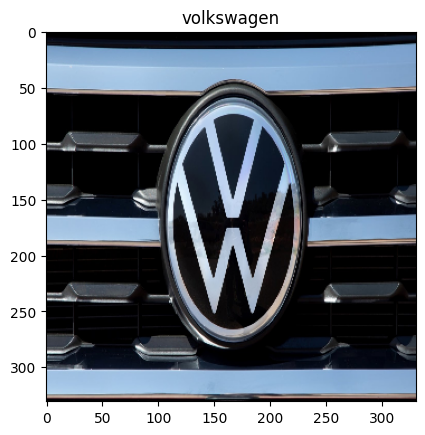

Original Dimensions :  (464, 500, 3)
1/1 [==============================] - 0s 23ms/step
volkswagen


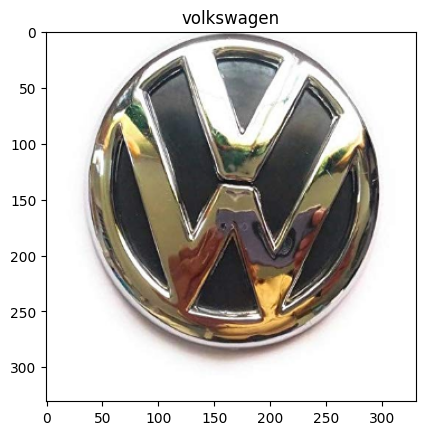

In [25]:
GetResultForImage("hyundai-1.jpg")
GetResultForImage("hyundai-2.jpg")


GetResultForImage("lexus-1.jpg")
GetResultForImage("lexus-2.jpg")


GetResultForImage("mazda-1.jpg")
GetResultForImage("mazda-2.jpg")


GetResultForImage("mercedes-1.jpg")
GetResultForImage("mercedes-2.jpg")



GetResultForImage("opel-1.jpg")
GetResultForImage("opel-2.jpg")

GetResultForImage("skoda-1.jpg")
GetResultForImage("skoda-2.jpg")

GetResultForImage("toyota-1.jpg")
GetResultForImage("toyota-2.jpg")


GetResultForImage("volkswagen-1.jpg")
GetResultForImage("volkswagen-2.jpg")

# **Visualizing Layers of VGG19 Model**

In [26]:
vgg_inputs = model.input
vgg_layers = model.layers
layer_names = [layer.name for layer in model.layers]
vgg_layer_outputs = [layer.output for layer in vgg_layers ]

for (i, item) in enumerate(layer_names, start=0):
  print(i, item)

0 block1_conv1
1 block1_conv2
2 block1_pool
3 block2_conv1
4 block2_conv2
5 block2_pool
6 block3_conv1
7 block3_conv2
8 block3_conv3
9 block3_conv4
10 block3_pool
11 block4_conv1
12 block4_conv2
13 block4_conv3
14 block4_conv4
15 block4_pool
16 block5_conv1
17 block5_conv2
18 block5_conv3
19 block5_conv4
20 block5_pool
21 flatten
22 dense
23 activation
24 dropout
25 dense_1
26 activation_1
27 dropout_1
28 dense_2
29 activation_2


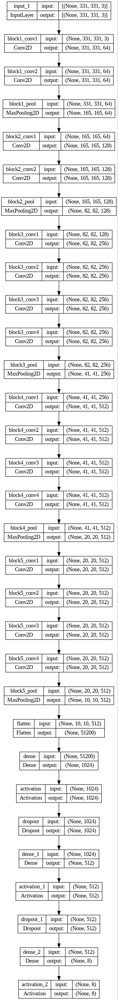

In [27]:
# create a new model based on this above information

feature_model = Model(inputs = vgg_inputs, outputs = vgg_layer_outputs )
tf.keras.utils.plot_model(feature_model, 'img.jpg', show_shapes = True)

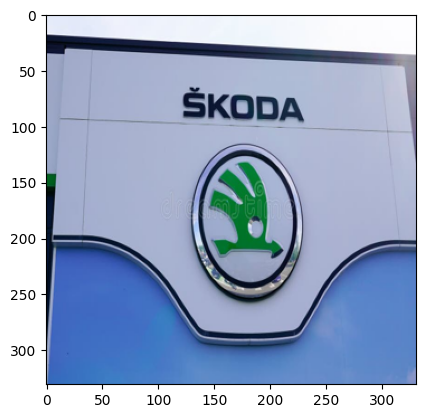

In [29]:
image_path = 'skoda-1.jpg'
img = Image.open(image_path)
img = img.resize((331, 331))
plt.imshow(img)
x = np.array(img)
x = np.expand_dims(x, axis=0)



In [30]:
x = x / 255.0
extracted_features=feature_model(x)


In [31]:
expected_input_shape = (None, 331, 331, 3)
print(f"Expected input shape: {expected_input_shape}")
print(f"Model input shape: {feature_model.input_shape}")

Expected input shape: (None, 331, 331, 3)
Model input shape: (None, 331, 331, 3)



 f1.shape:  (1, 331, 331, 64) Layer: block1_conv1


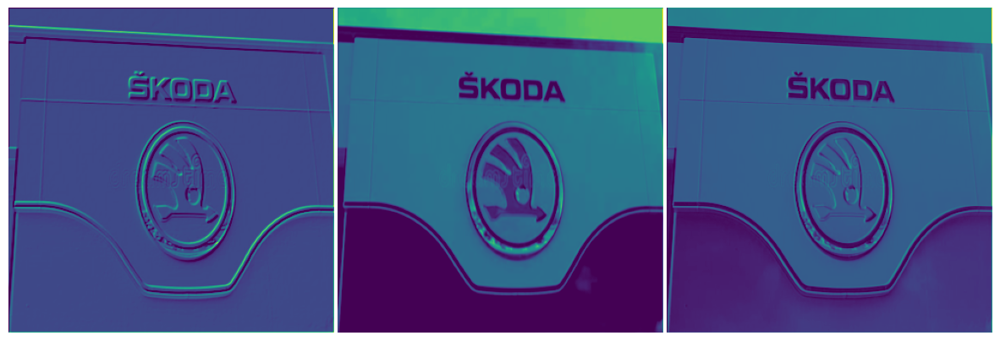

In [32]:
f1 = extracted_features [0]
print('\n f1.shape: ', f1.shape, 'Layer:', layer_names[0])
imgs = f1[0,:,:]
plt.figure(figsize = (15,15))
for n in range(3):
  ax = plt.subplot(1,3, n+1)
  plt.imshow(imgs[:,:,n])
  plt.axis('off')
plt.subplots_adjust(wspace = 0.01, hspace = 0.01)


 f2.shape:  (1, 331, 331, 64) Layer: block1_conv2


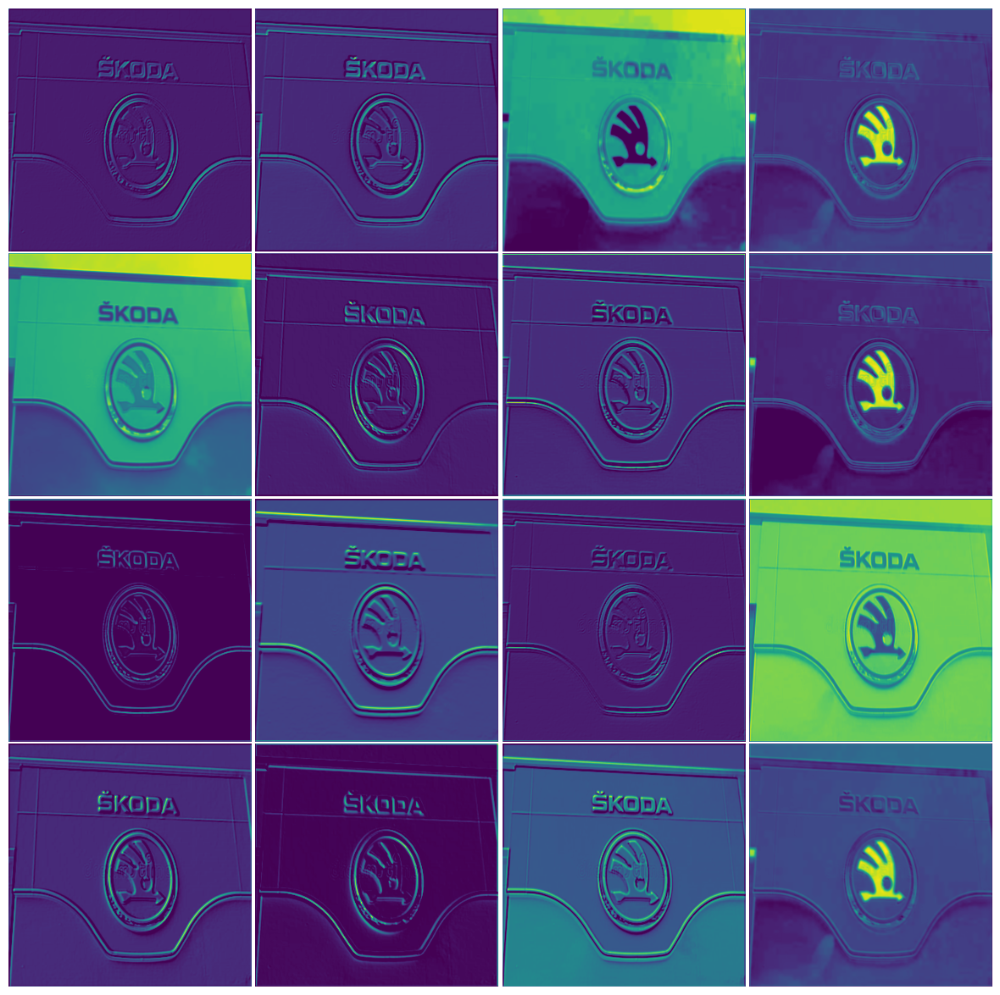

In [33]:
f2 = extracted_features[1]
print('\n f2.shape: ', f2.shape, 'Layer:', layer_names[1])

imgs =f2[0,:,:]
plt.figure(figsize =(15, 15))
for n in range(16):
  ax = plt.subplot(4, 4, n+1)
  plt.imshow(imgs[:,:,n])
  plt.axis('off')
plt.subplots_adjust(wspace = 0.01, hspace = 0.01)

0 Layer: block1_conv1 Layer shape:  (1, 331, 331, 64)


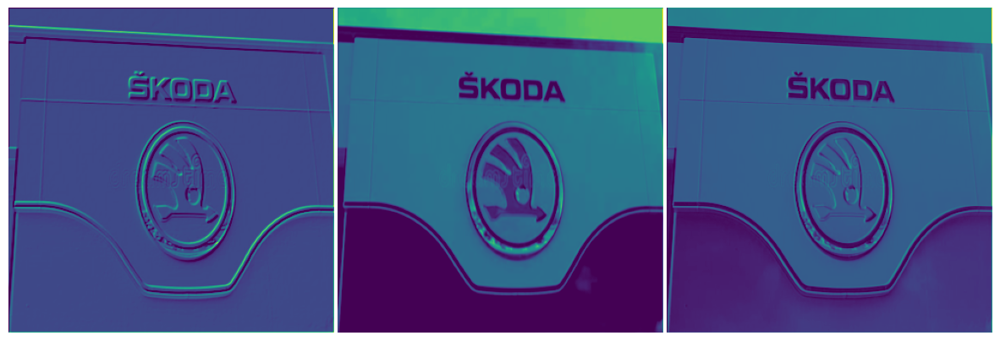

1 Layer: block1_conv2 Layer shape:  (1, 331, 331, 64)


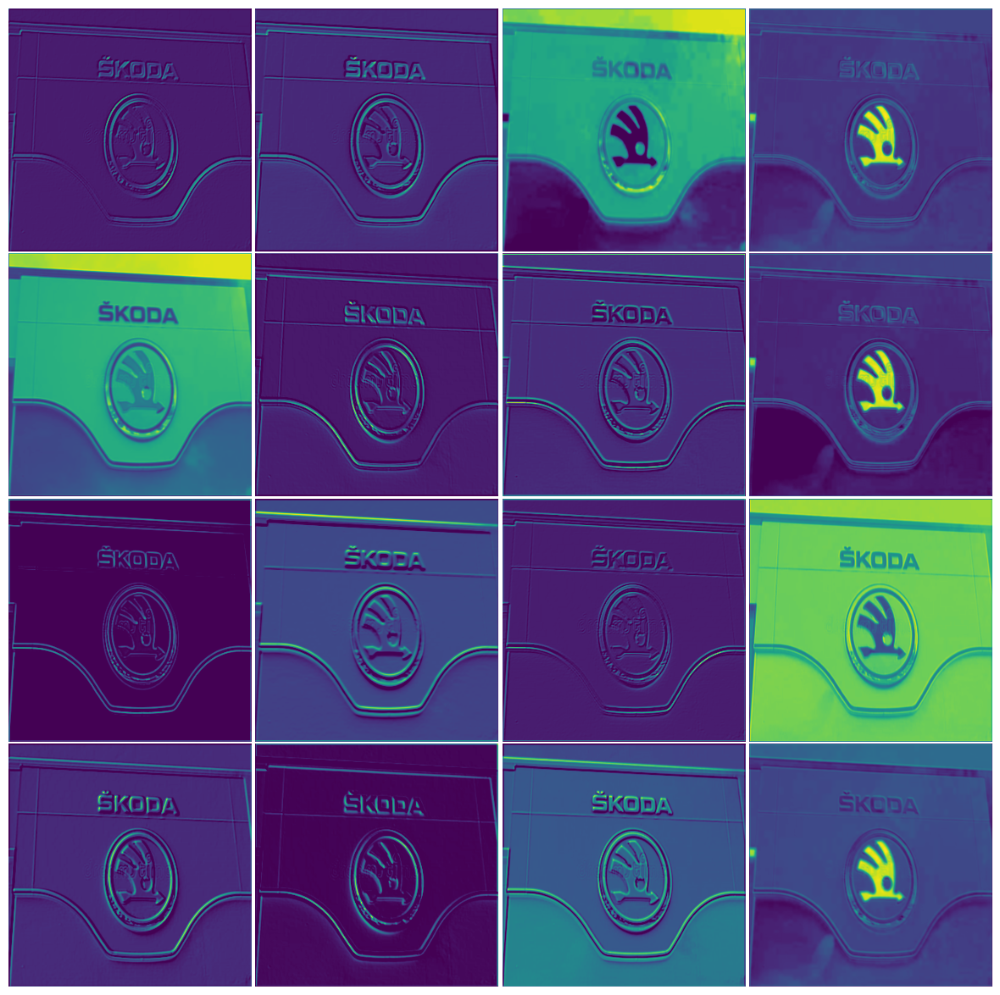

2 Layer: block1_pool Layer shape:  (1, 165, 165, 64)


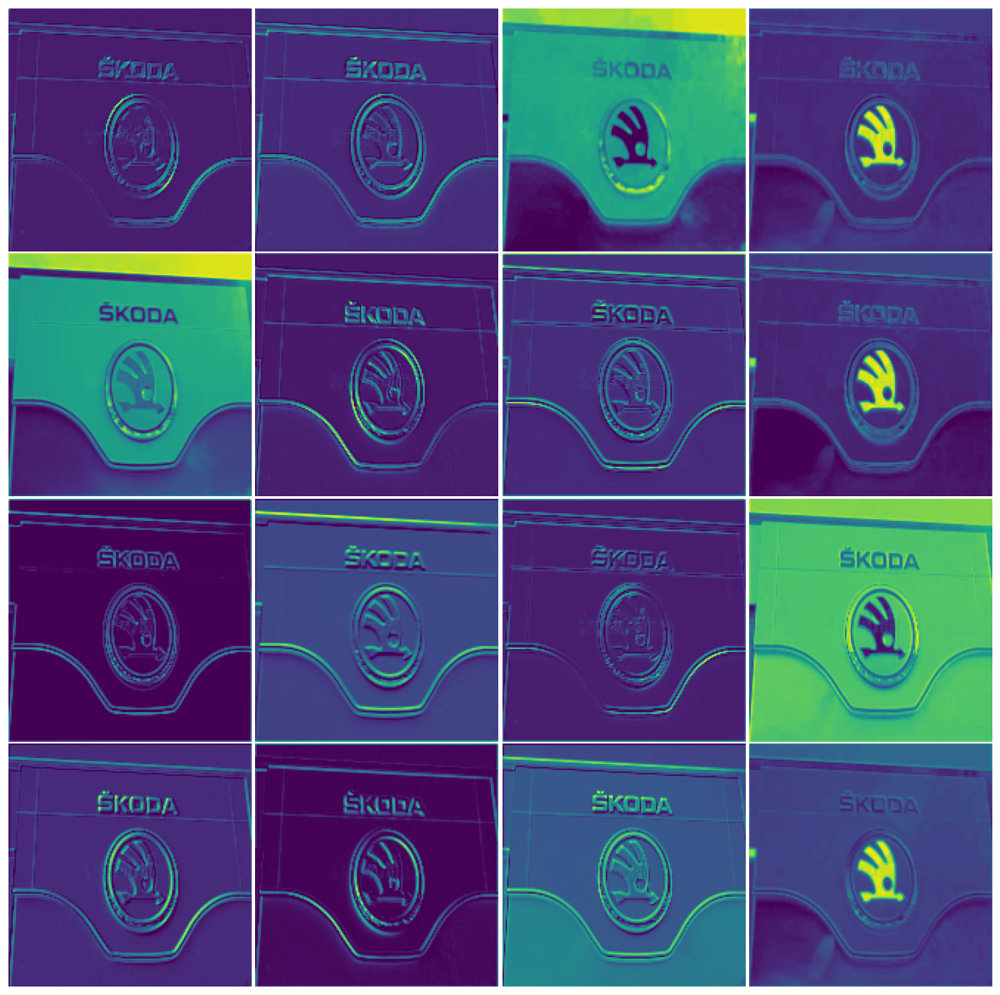

3 Layer: block2_conv1 Layer shape:  (1, 165, 165, 128)


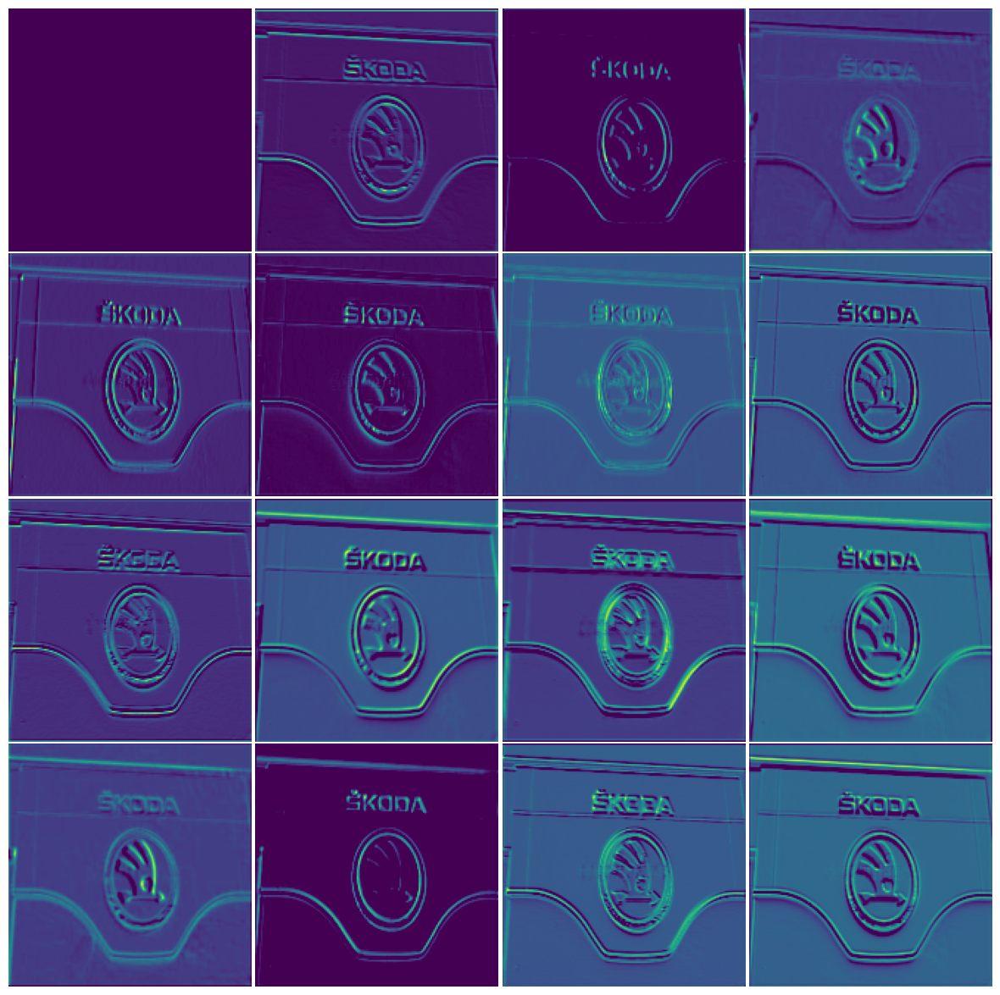

4 Layer: block2_conv2 Layer shape:  (1, 165, 165, 128)


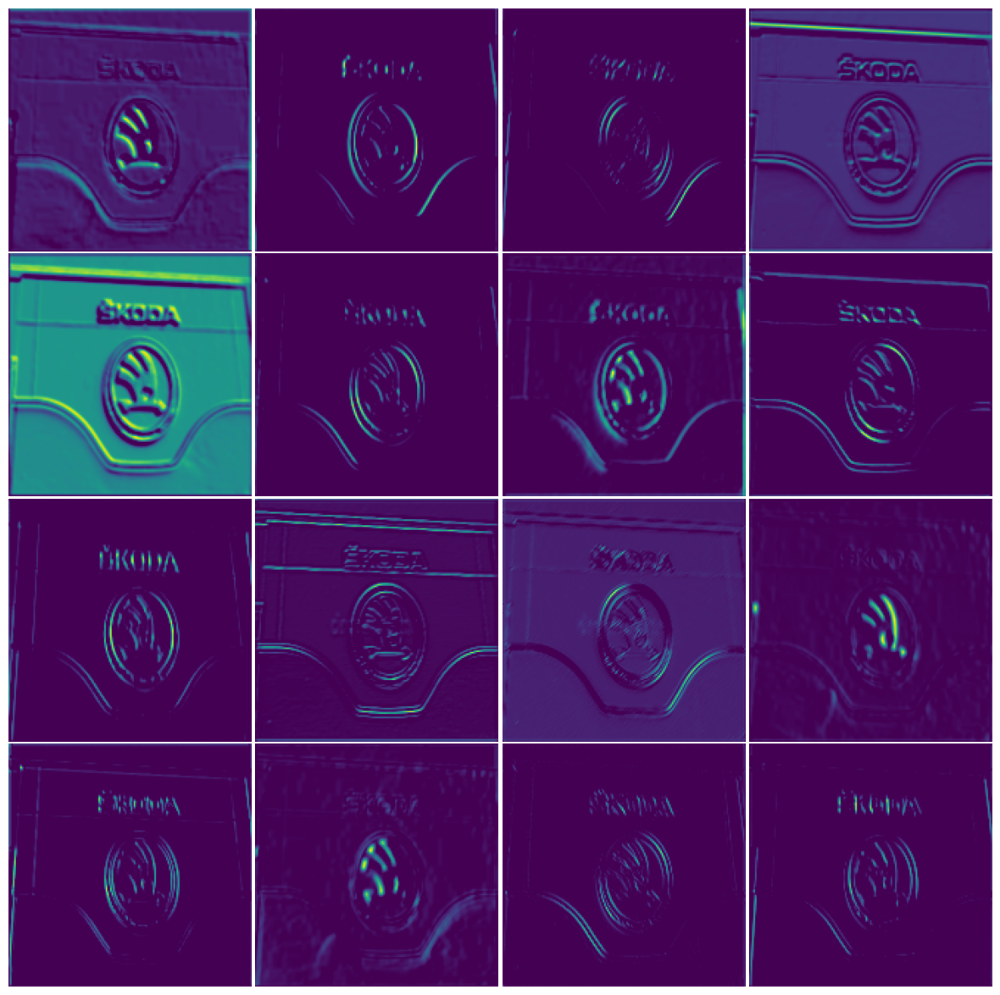

5 Layer: block2_pool Layer shape:  (1, 82, 82, 128)


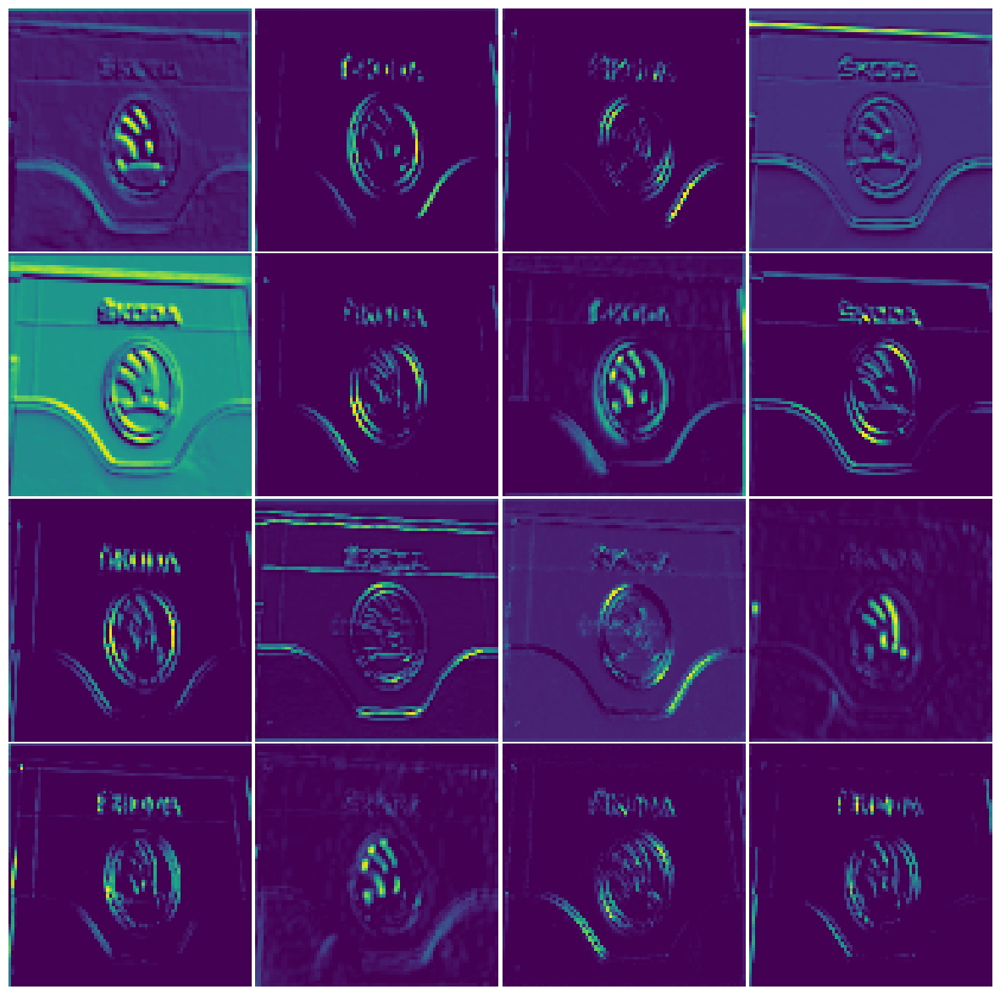

6 Layer: block3_conv1 Layer shape:  (1, 82, 82, 256)


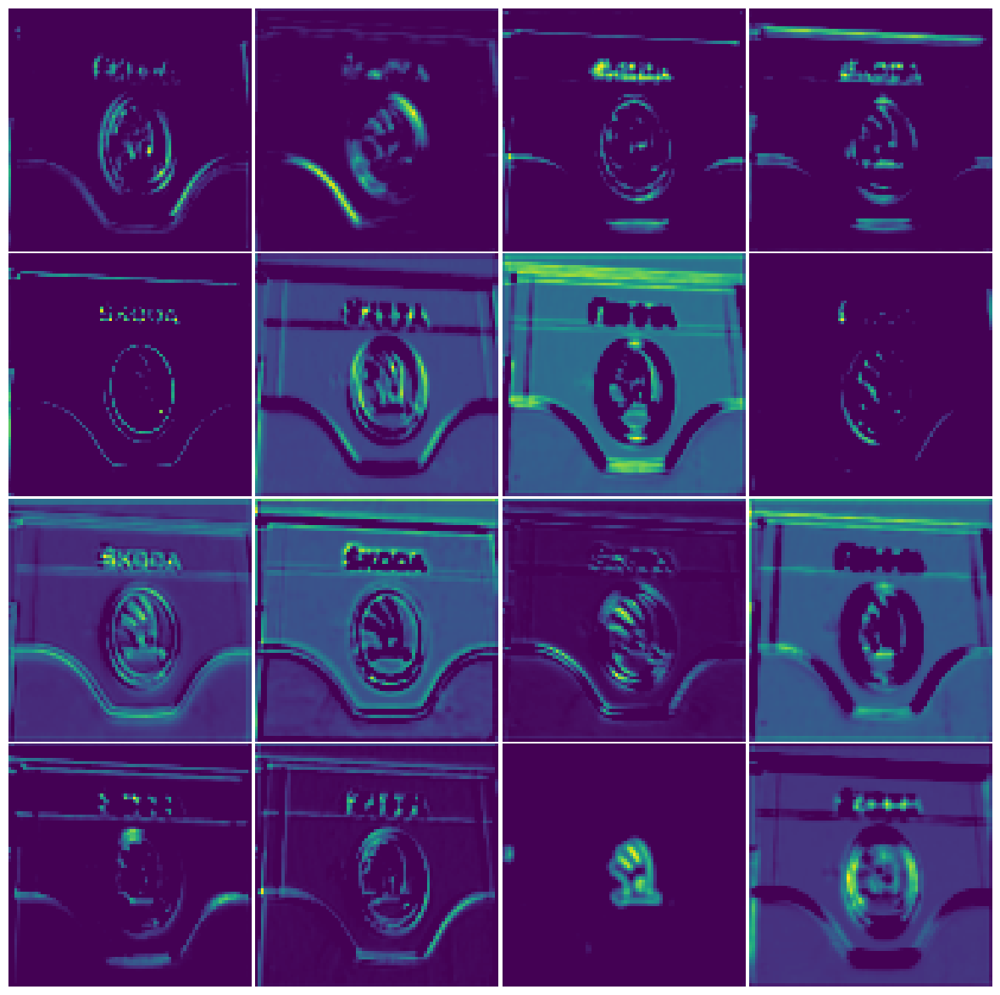

7 Layer: block3_conv2 Layer shape:  (1, 82, 82, 256)


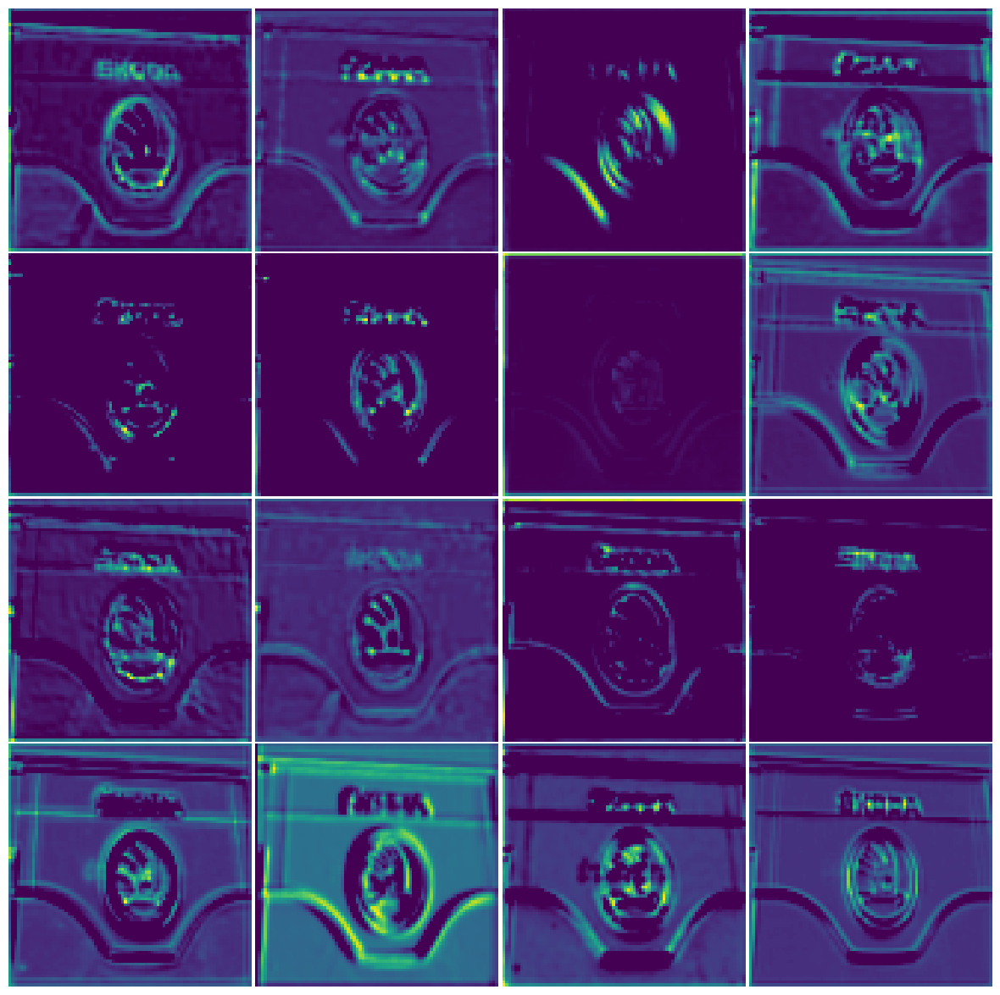

8 Layer: block3_conv3 Layer shape:  (1, 82, 82, 256)


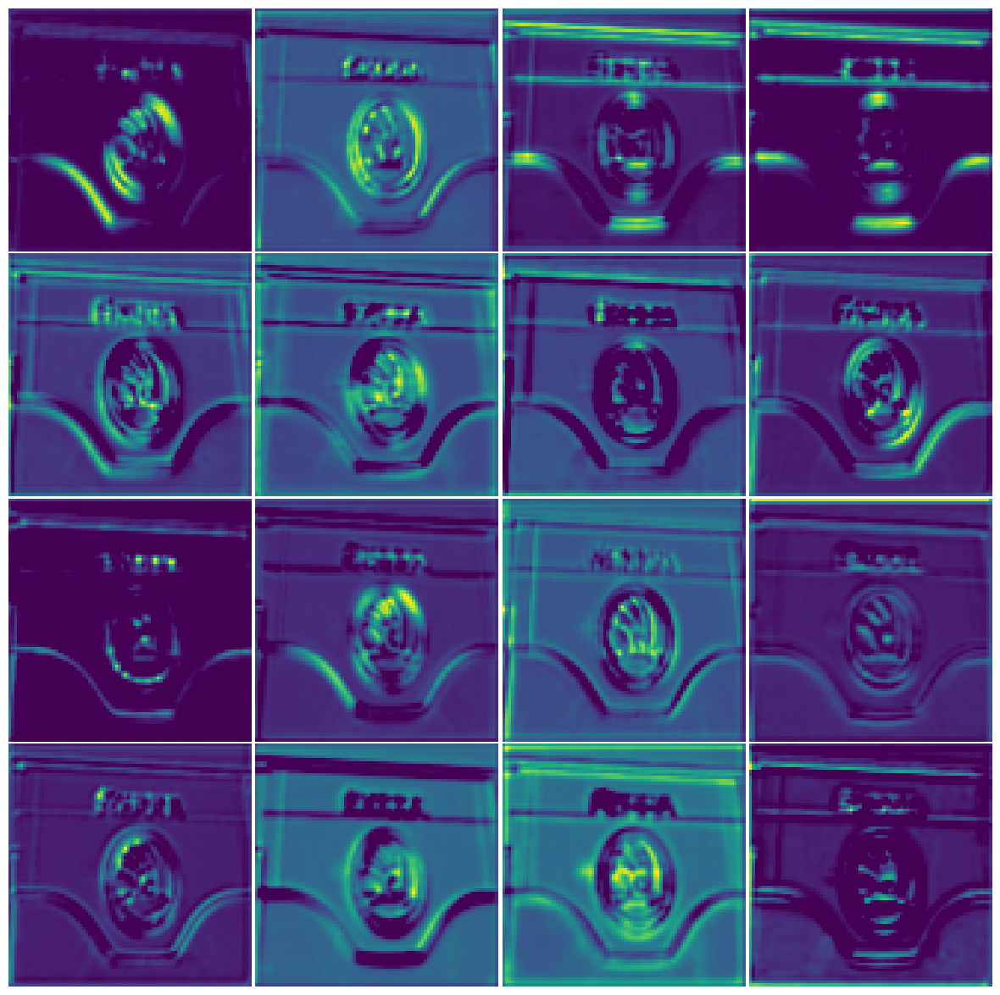

9 Layer: block3_conv4 Layer shape:  (1, 82, 82, 256)


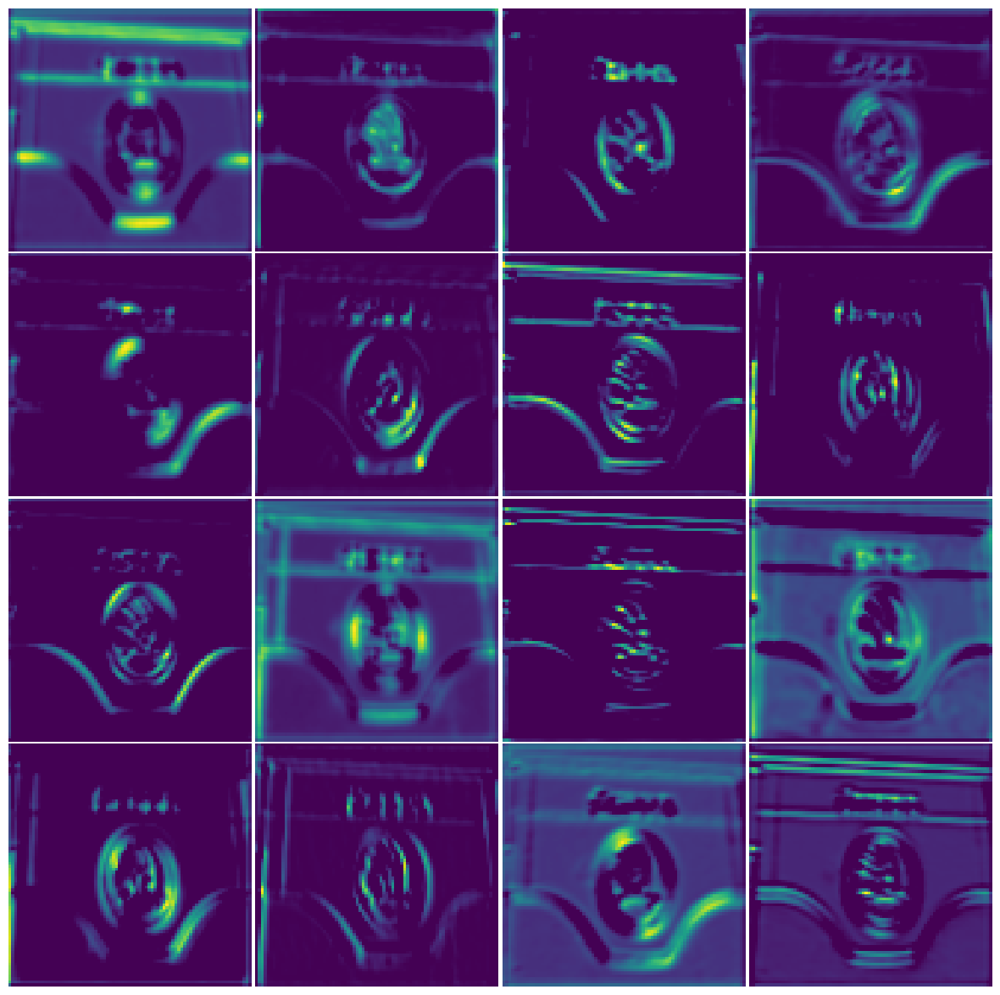

10 Layer: block3_pool Layer shape:  (1, 41, 41, 256)


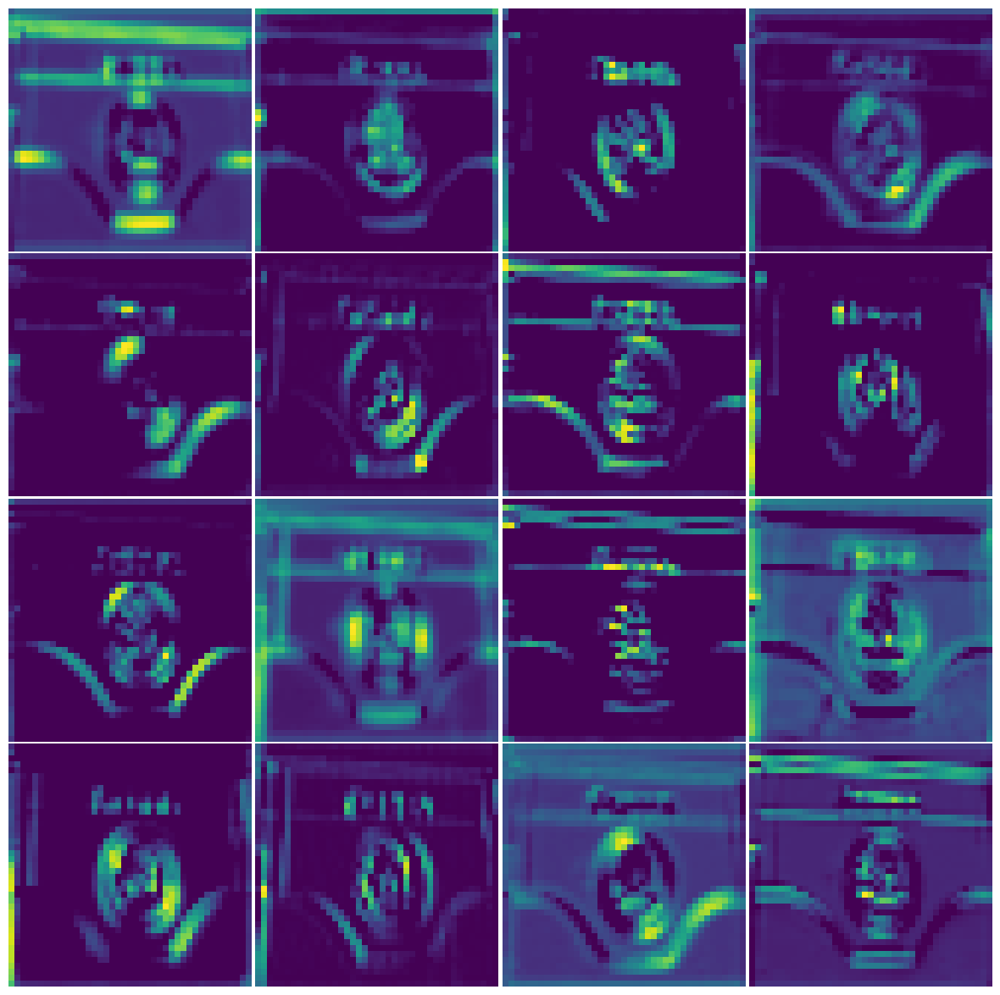

11 Layer: block4_conv1 Layer shape:  (1, 41, 41, 512)


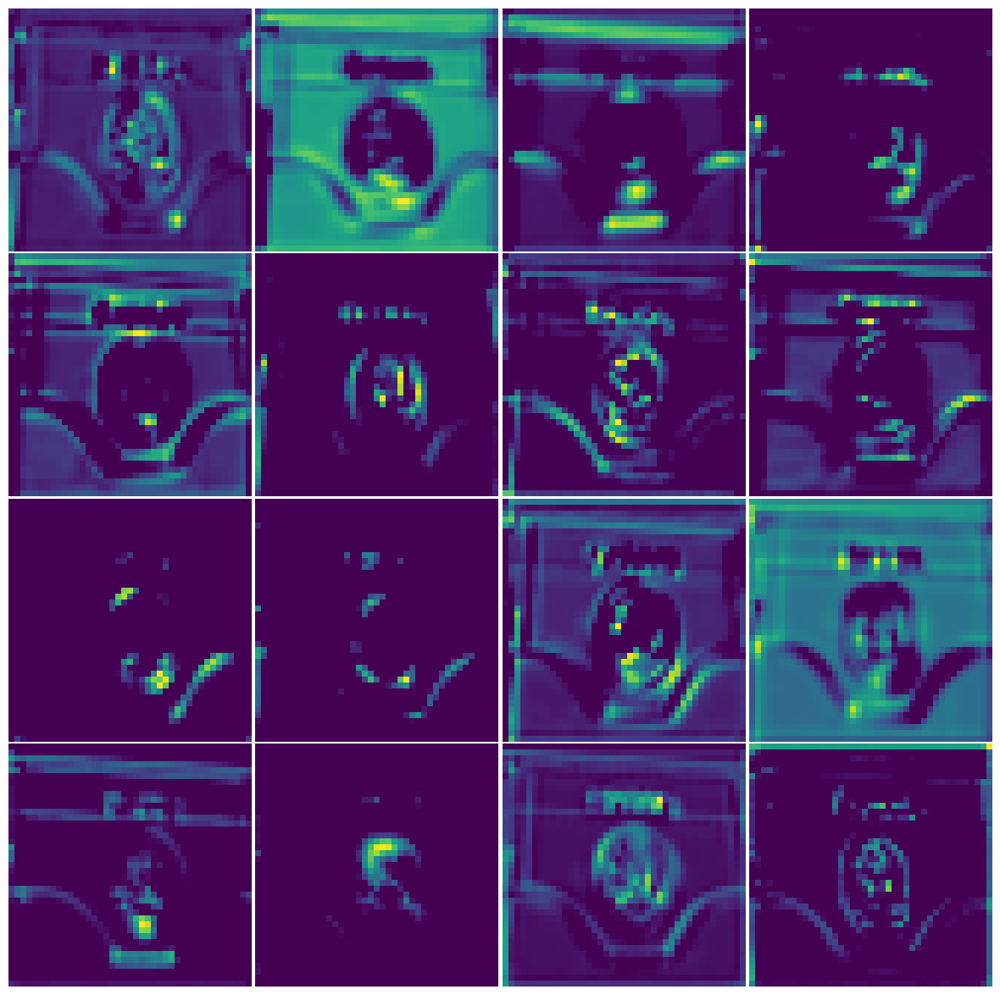

12 Layer: block4_conv2 Layer shape:  (1, 41, 41, 512)


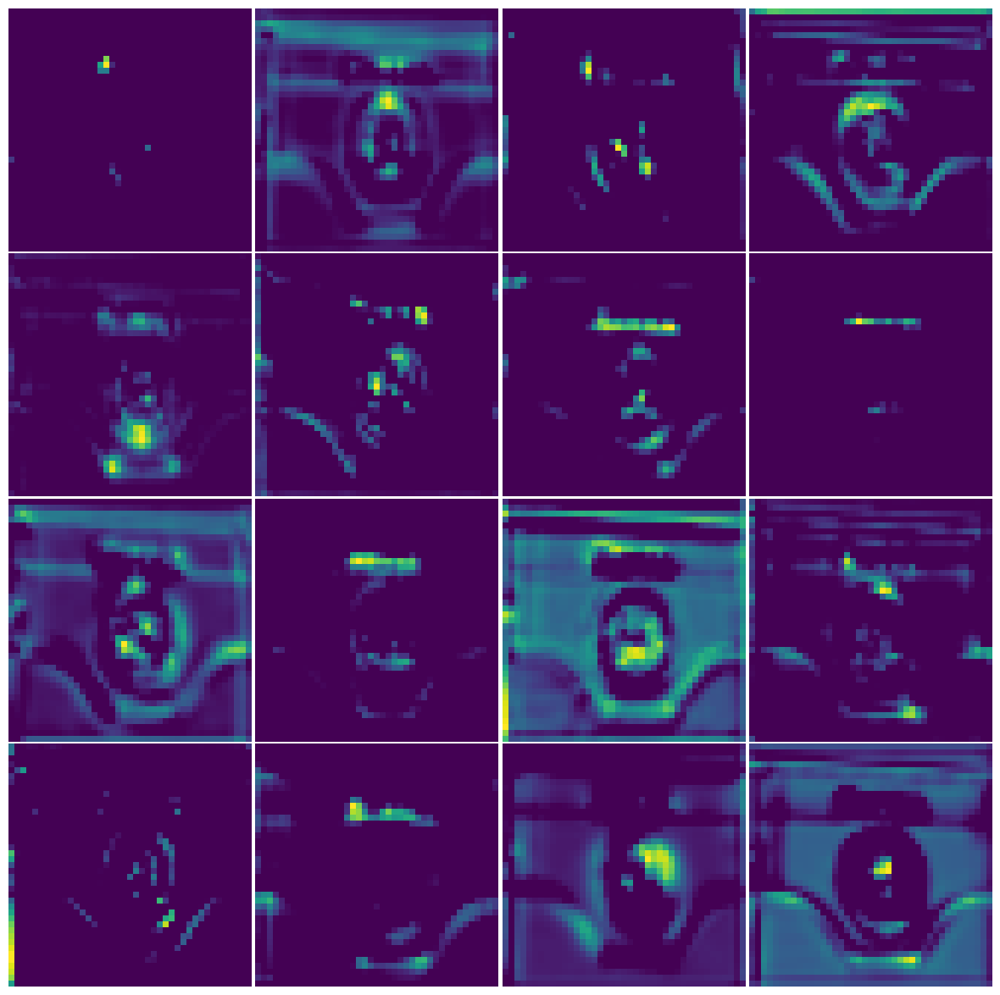

13 Layer: block4_conv3 Layer shape:  (1, 41, 41, 512)


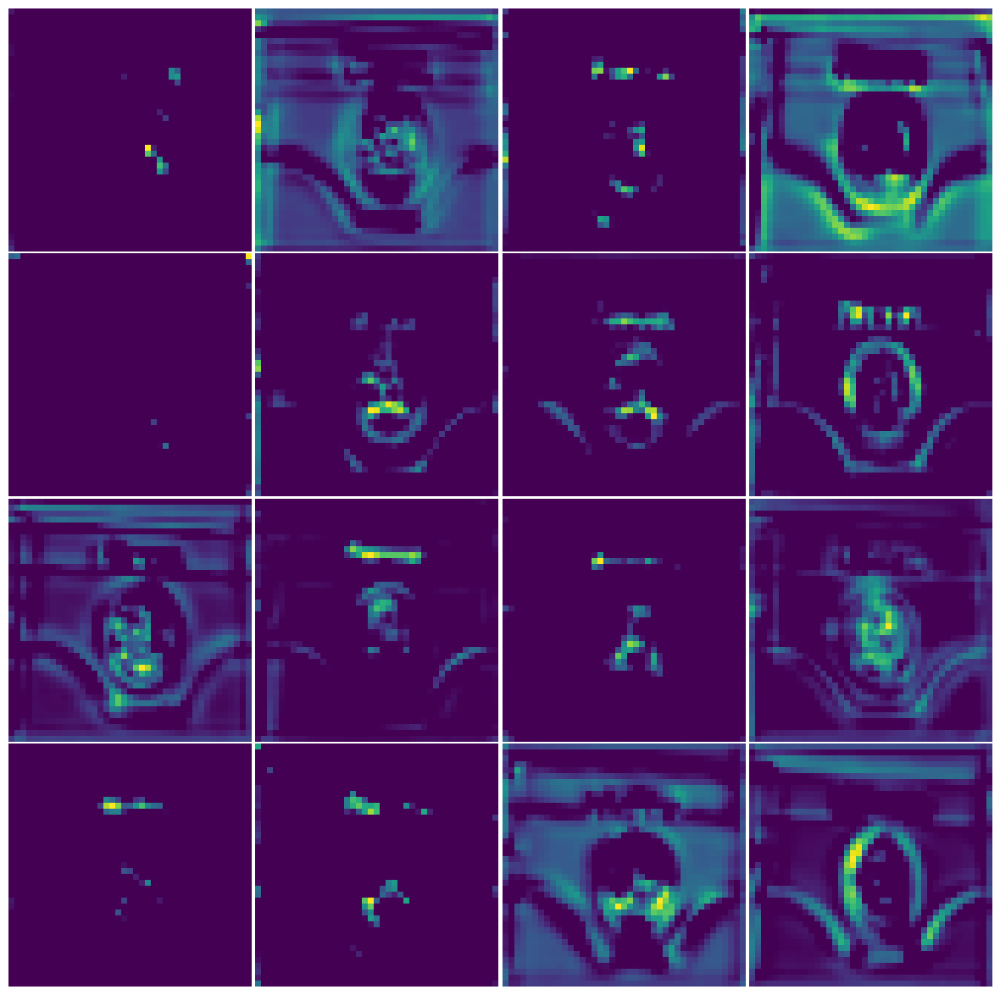

14 Layer: block4_conv4 Layer shape:  (1, 41, 41, 512)


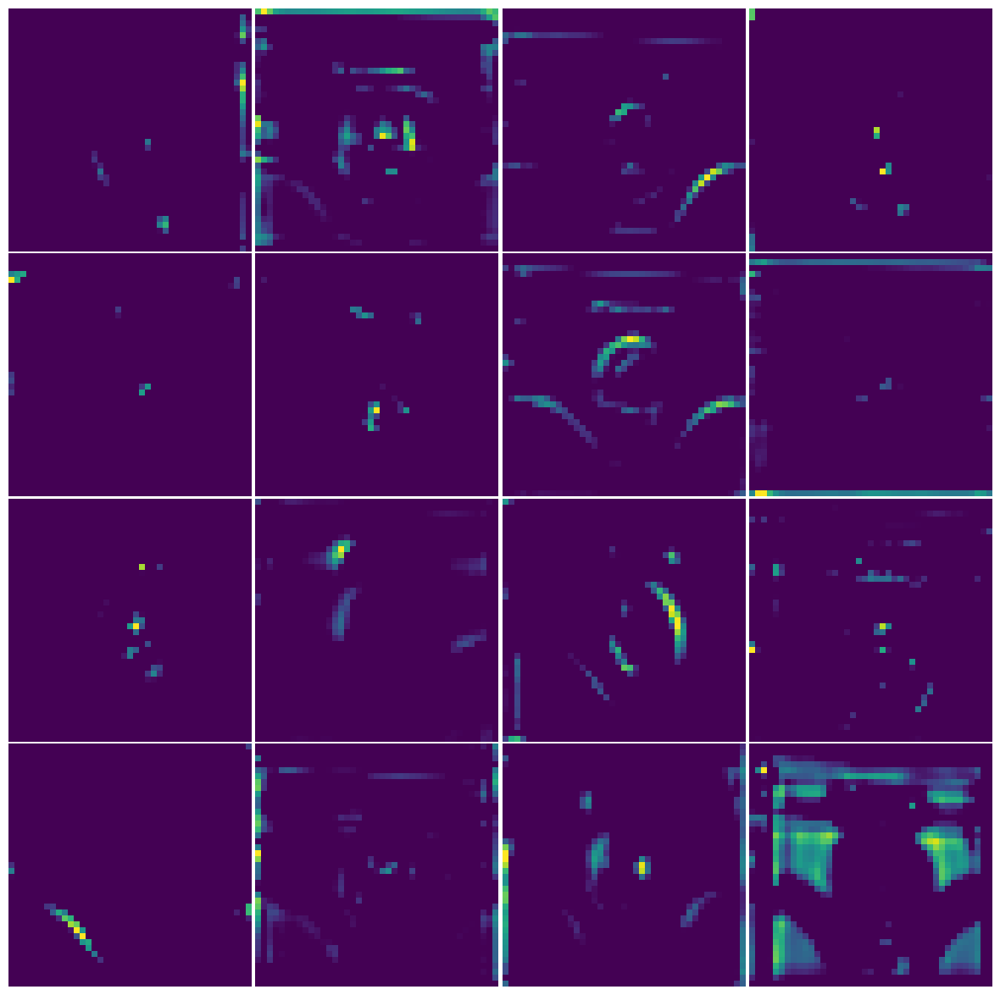

15 Layer: block4_pool Layer shape:  (1, 20, 20, 512)


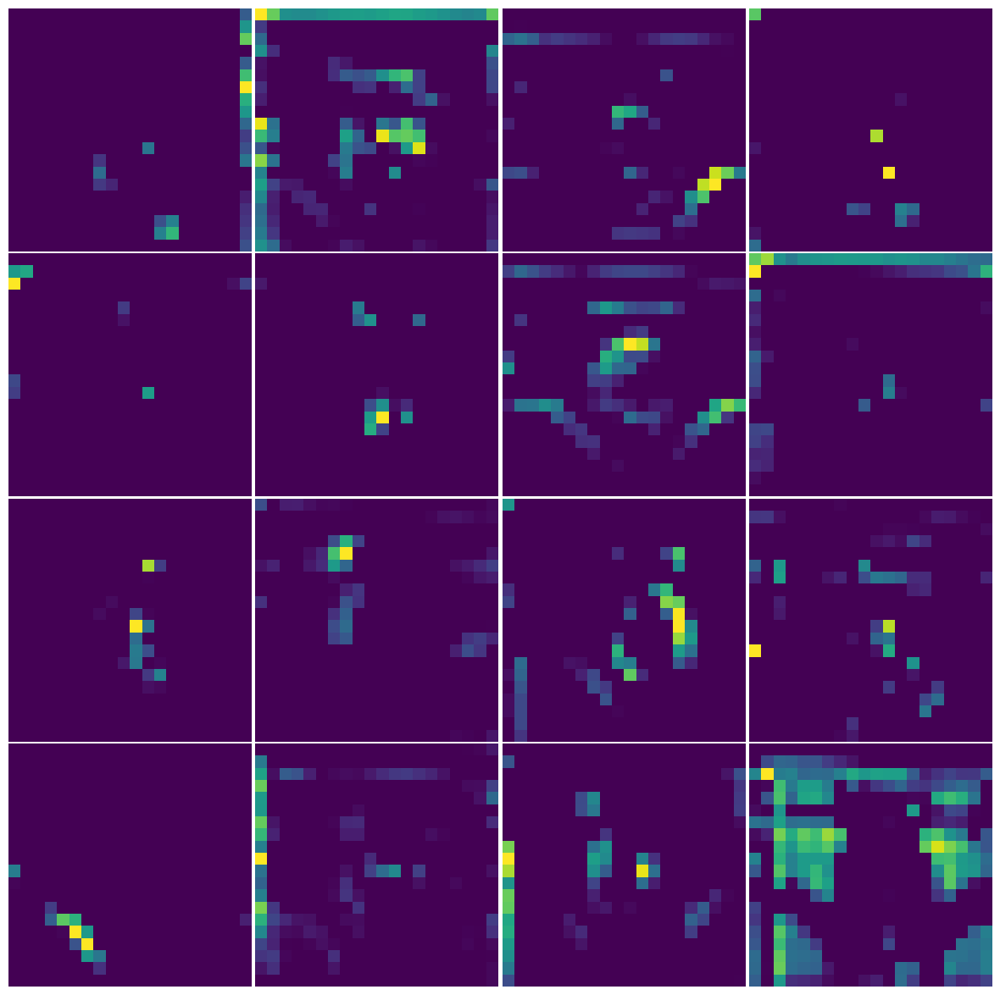

16 Layer: block5_conv1 Layer shape:  (1, 20, 20, 512)


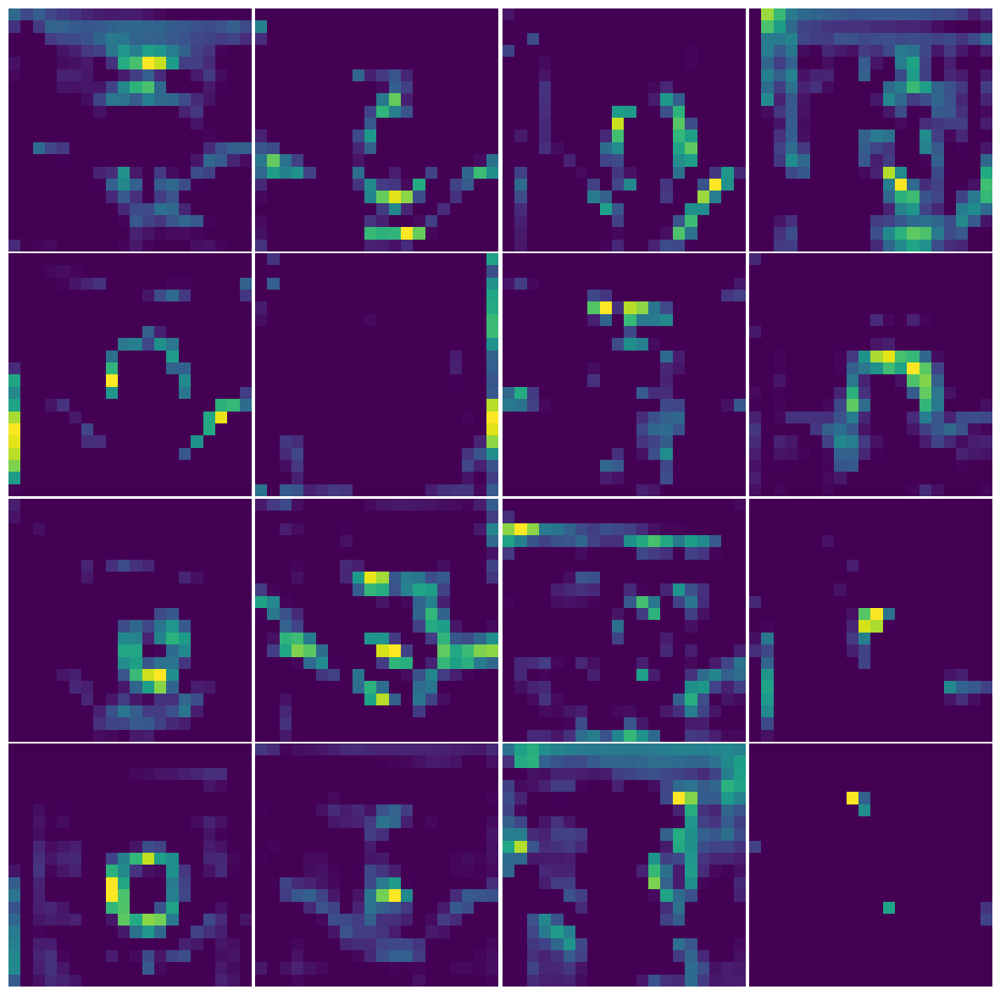

17 Layer: block5_conv2 Layer shape:  (1, 20, 20, 512)


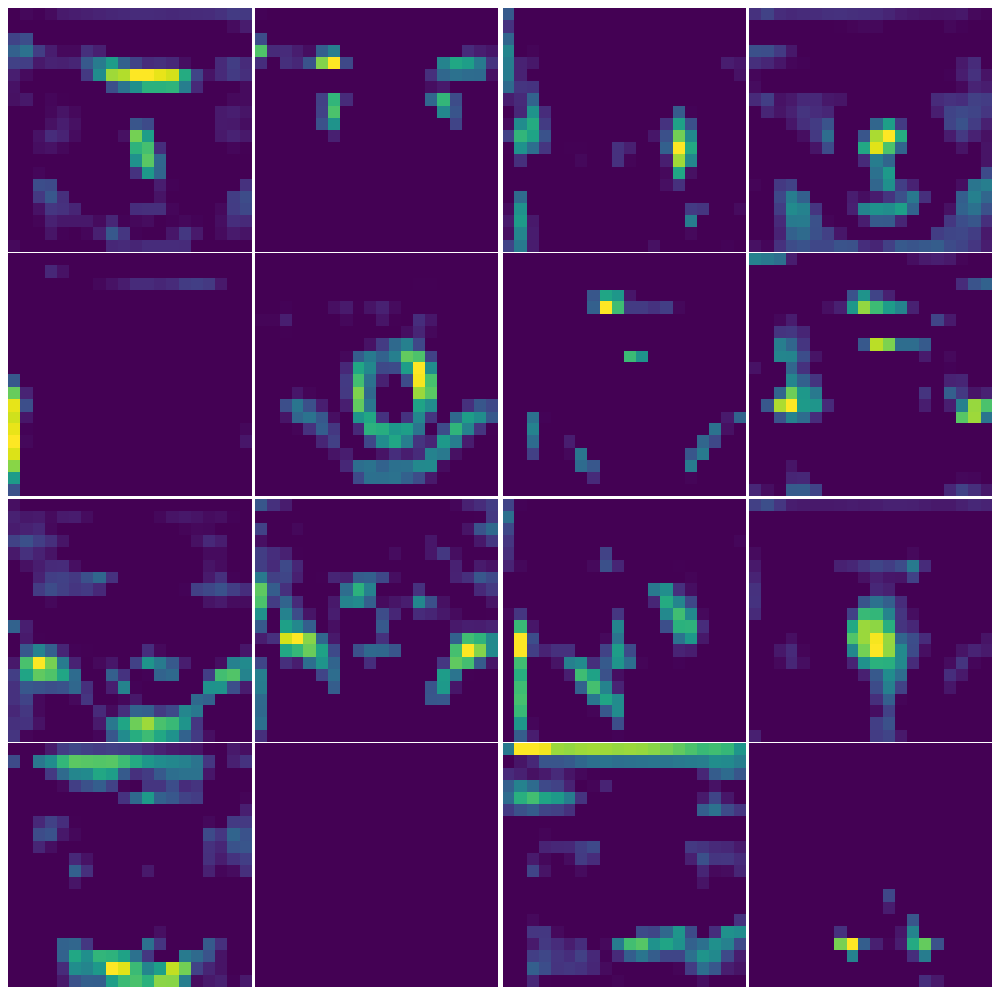

18 Layer: block5_conv3 Layer shape:  (1, 20, 20, 512)


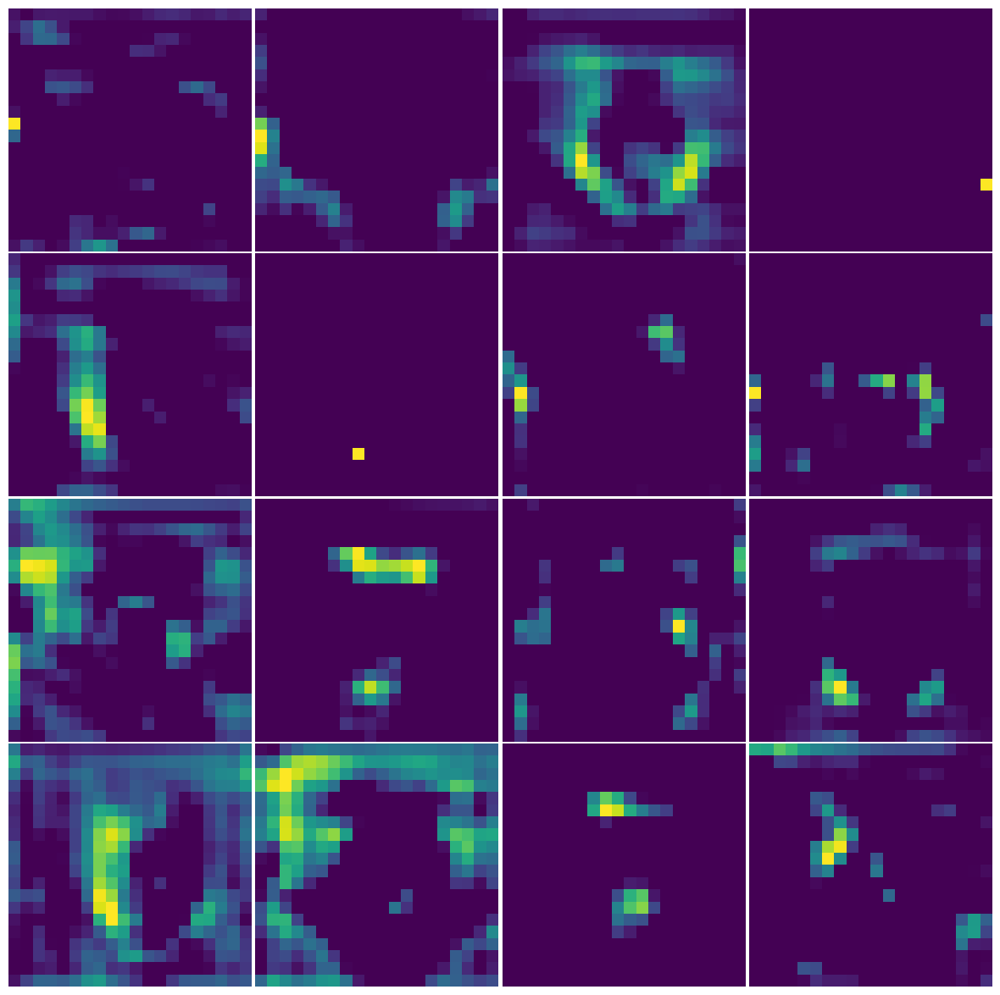

19 Layer: block5_conv4 Layer shape:  (1, 20, 20, 512)


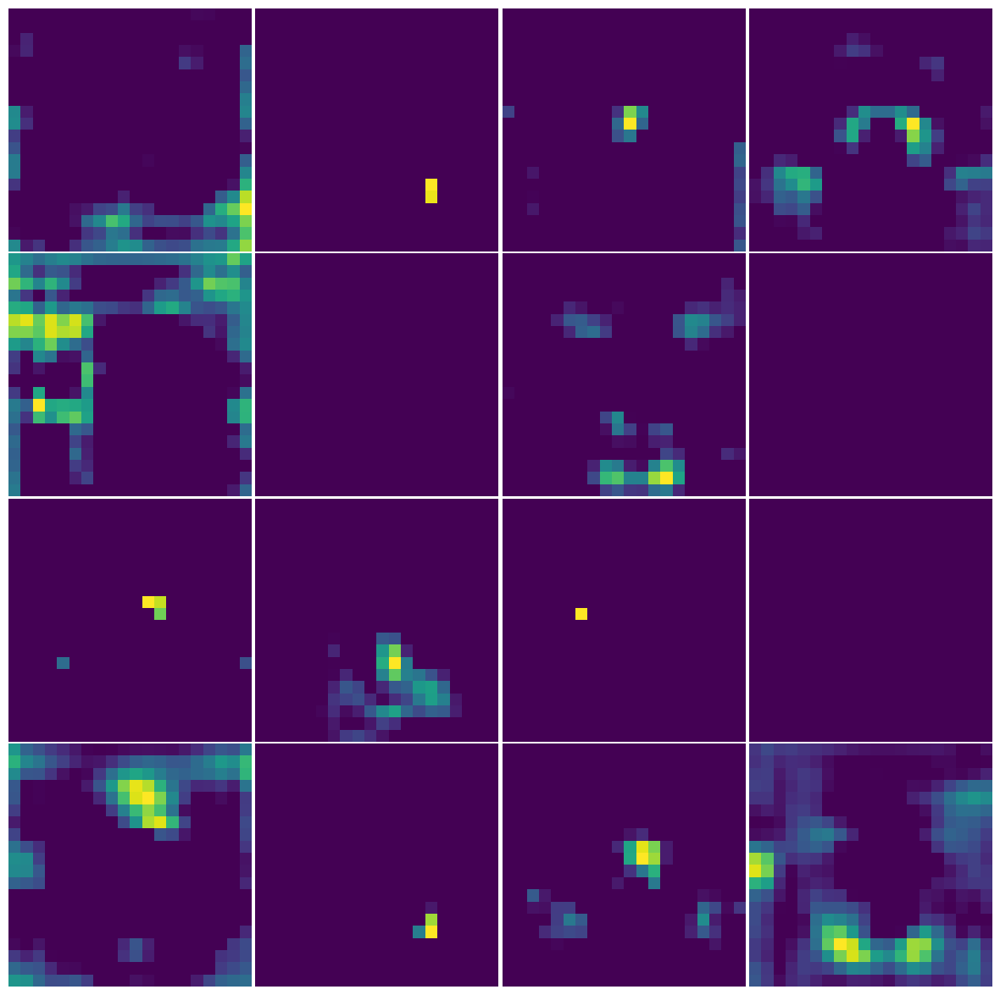

20 Layer: block5_pool Layer shape:  (1, 10, 10, 512)


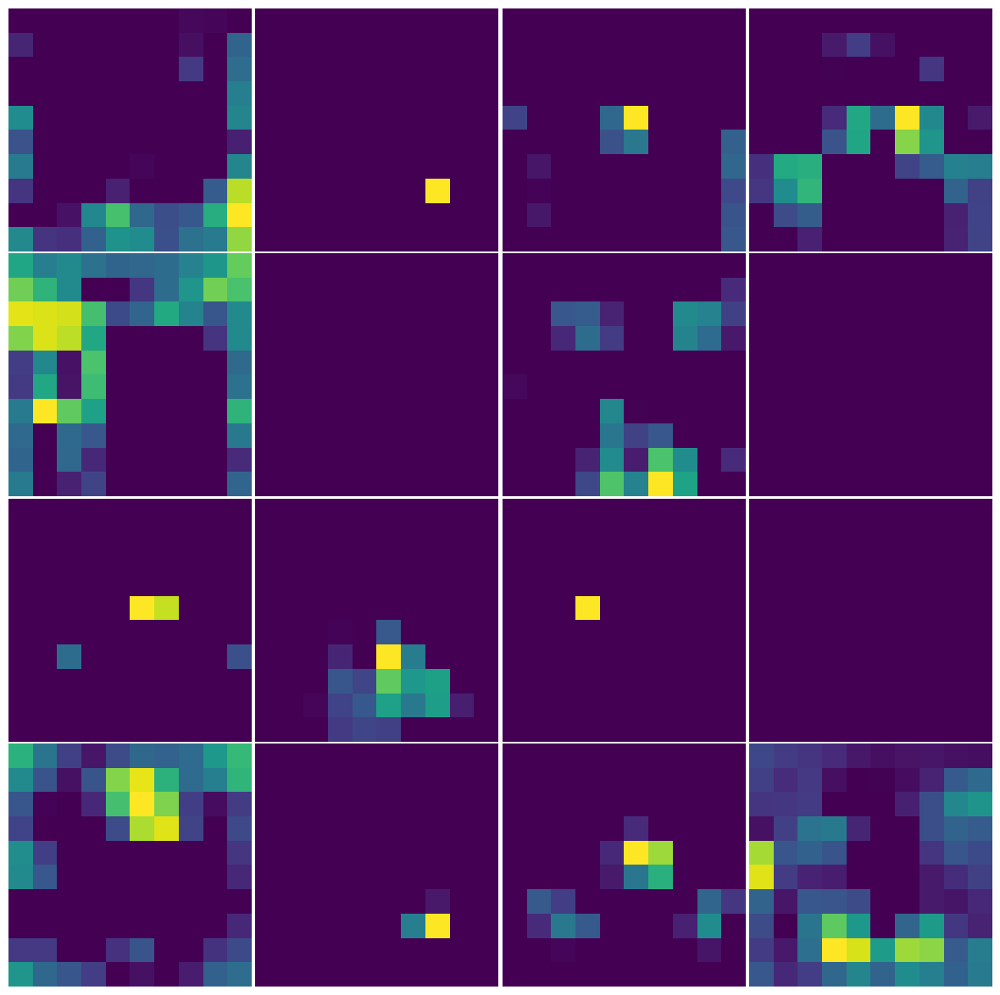

21 Layer: flatten Layer shape:  (1, 51200)


<Figure size 1500x1500 with 0 Axes>

22 Layer: dense Layer shape:  (1, 1024)


<Figure size 1500x1500 with 0 Axes>

23 Layer: activation Layer shape:  (1, 1024)


<Figure size 1500x1500 with 0 Axes>

24 Layer: dropout Layer shape:  (1, 1024)


<Figure size 1500x1500 with 0 Axes>

25 Layer: dense_1 Layer shape:  (1, 512)


<Figure size 1500x1500 with 0 Axes>

26 Layer: activation_1 Layer shape:  (1, 512)


<Figure size 1500x1500 with 0 Axes>

27 Layer: dropout_1 Layer shape:  (1, 512)


<Figure size 1500x1500 with 0 Axes>

28 Layer: dense_2 Layer shape:  (1, 8)


<Figure size 1500x1500 with 0 Axes>

29 Layer: activation_2 Layer shape:  (1, 8)


<Figure size 1500x1500 with 0 Axes>

In [34]:
for i in range(0, len(extracted_features)):
    print(i, 'Layer:', layer_names[i], 'Layer shape: ', extracted_features[i].shape)
    plt.figure(figsize=(15, 15))
    if (extracted_features[i].ndim == 4):
        features = extracted_features[i]
        imgs = features[0, :, :]
        if (i == 0):
            for n in range(3):
                ax = plt.subplot(1, 3, n+1)
                plt.imshow(imgs[:, :, n])
                plt.axis('off')
                plt.subplots_adjust(wspace=0.01, hspace=0.01)
        else:
            imgs = extracted_features[i][0, :, :]
            for n in range(16):
                ax = plt.subplot(4, 4, n+1)
                plt.imshow(imgs[:, :, n])
                plt.axis('off')
                plt.subplots_adjust(wspace=0.01, hspace=0.01)
    plt.show()
